Project Title :-

# Model Bike rental prediction using Machine Learning


Task:
explainable_AI_starter.ipynb

1. Understand how the H2o package helps in explainability with various plots on
relation between attributes and the defect prediction.

2. Build an explainable ML model using the H2o package on the bike rental dataset
and display various plots and write your findings.

b. Consider the Day data and hourly data and build two models separately.

1.c. Try at least two models (AutoML and any other model like gradient
boosting) for the Day dataset.

d. Discuss how various plots try to explain the amount of bikes rented
correspond to the various environmental conditions.


### Understanding the Data Set

The Data Set contains the following information:
- instant: record index
- dteday : date
- season : season (1:spring, 2:summer, 3:fall, 4:winter)
- yr : year (0: 2011, 1:2012)
- mnth : month ( 1 to 12)
- hr : hour (0 to 23)
- holiday : weather day is holiday or not (extracted from http://dchr.dc.gov/page/holiday-schedule)
- weekday : day of the week
- workingday : if day is neither weekend nor holiday is 1, otherwise is 0.
+ weathersit :
	- 1: Clear, Few clouds, Partly cloudy, Partly cloudy
	- 2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist
	- 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds
	- 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog
- temp : Normalized temperature in Celsius. The values are divided to 41 (max)
- atemp: Normalized feeling temperature in Celsius. The values are divided to 50 (max)
- hum: Normalized humidity. The values are divided to 100 (max)
- windspeed: Normalized wind speed. The values are divided to 67 (max)
- casual: count of casual users
- registered: count of registered users
- cnt: count of total rental bikes including both casual and registered

### Importing Standard libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
from sklearn import linear_model

import warnings
warnings.filterwarnings('ignore')


### Loading the Data Set

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# set the input file path

filepath1 = '/content/drive/MyDrive/Datasets/bike sharing dataset/day.csv'

In [4]:
day_df = pd.read_csv(filepath1)

day_df.head(5)

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985
1,2,2011-01-02,1,0,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801
2,3,2011-01-03,1,0,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349
3,4,2011-01-04,1,0,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562
4,5,2011-01-05,1,0,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600


In [5]:
day_df.shape

(731, 16)

In [6]:
day_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     731 non-null    int64  
 1   dteday      731 non-null    object 
 2   season      731 non-null    int64  
 3   yr          731 non-null    int64  
 4   mnth        731 non-null    int64  
 5   holiday     731 non-null    int64  
 6   weekday     731 non-null    int64  
 7   workingday  731 non-null    int64  
 8   weathersit  731 non-null    int64  
 9   temp        731 non-null    float64
 10  atemp       731 non-null    float64
 11  hum         731 non-null    float64
 12  windspeed   731 non-null    float64
 13  casual      731 non-null    int64  
 14  registered  731 non-null    int64  
 15  cnt         731 non-null    int64  
dtypes: float64(4), int64(11), object(1)
memory usage: 91.5+ KB


In [7]:
# checking for null values

day_df.isnull().sum()

instant       0
dteday        0
season        0
yr            0
mnth          0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64

In [8]:
day_df.describe()

,instant,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
count,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000
mean,366.000000,2.496580,0.500684,6.519836,0.028728,2.997264,0.683995,1.395349,0.495385,0.474354,0.627894,0.190486,848.176471,3656.172367,4504.348837
std,211.165812,1.110807,0.500342,3.451913,0.167155,2.004787,0.465233,0.544894,0.183051,0.162961,0.142429,0.077498,686.622488,1560.256377,1937.211452
min,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.059130,0.079070,0.000000,0.022392,2.000000,20.000000,22.000000
25%,183.500000,2.000000,0.000000,4.000000,0.000000,1.000000,0.000000,1.000000,0.337083,0.337842,0.520000,0.134950,315.500000,2497.000000,3152.000000
50%,366.000000,3.000000,1.000000,7.000000,0.000000,3.000000,1.000000,1.000000,0.498333,0.486733,0.626667,0.180975,713.000000,3662.000000,4548.000000
75%,548.500000,3.000000,1.000000,10.000000,0.000000,5.000000,1.000000,2.000000,0.655417,0.608602,0.730209,0.233214,1096.000000,4776.500000,5956.000000
max,731.000000,4.000000,1.000000,12.000000,1.000000,6.000000,1.000000,3.000000,0.861667,0.840896,0.972500,0.507463,3410.000000,6946.000000,8714.000000


In [9]:
day_df.dtypes

instant         int64
dteday         object
season          int64
yr              int64
mnth            int64
holiday         int64
weekday         int64
workingday      int64
weathersit      int64
temp          float64
atemp         float64
hum           float64
windspeed     float64
casual          int64
registered      int64
cnt             int64
dtype: object

In [10]:
day_df.columns

Index(['instant', 'dteday', 'season', 'yr', 'mnth', 'holiday', 'weekday',
       'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed',
       'casual', 'registered', 'cnt'],
      dtype='object')

In [11]:
 #Converting redpective variables to required data format

day_df['dteday'] = pd.to_datetime(day_df.dteday)
day_df['season'] = day_df.season.astype('category')
day_df['yr'] = day_df.yr.astype('category')
day_df['mnth'] = day_df.mnth.astype('category')
day_df['holiday'] = day_df.holiday.astype('category')
day_df['weekday'] = day_df.weekday.astype('category')
day_df['workingday'] = day_df.workingday.astype('category')
day_df['weathersit'] = day_df.weathersit.astype('category')


In [12]:
day_df.dtypes

instant                int64
dteday        datetime64[ns]
season              category
yr                  category
mnth                category
holiday             category
weekday             category
workingday          category
weathersit          category
temp                 float64
atemp                float64
hum                  float64
windspeed            float64
casual                 int64
registered             int64
cnt                    int64
dtype: object

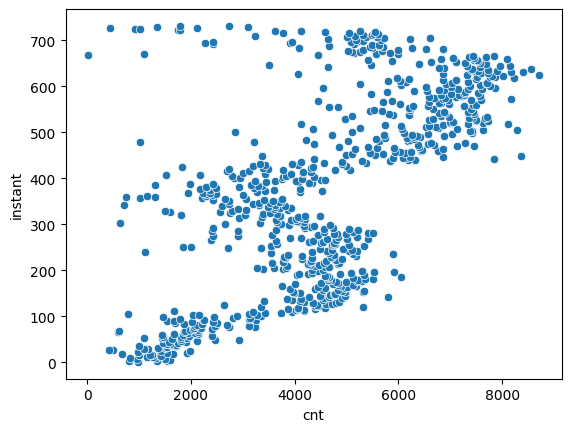

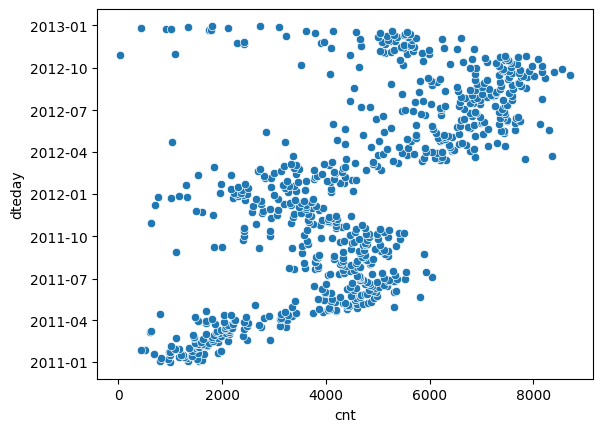

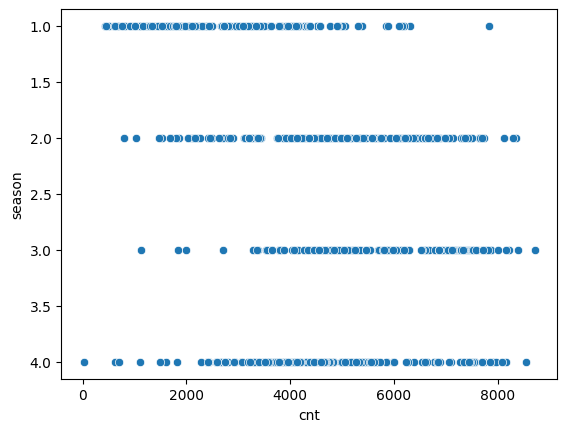

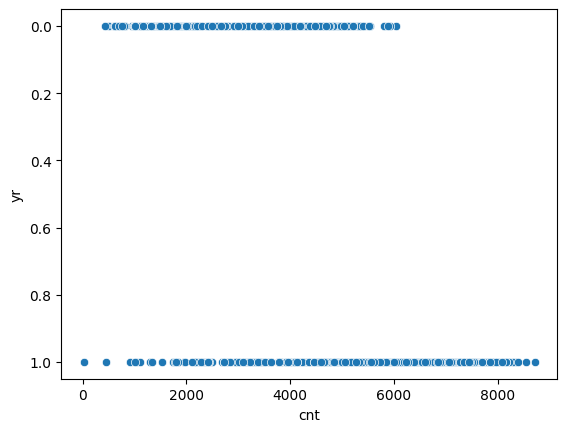

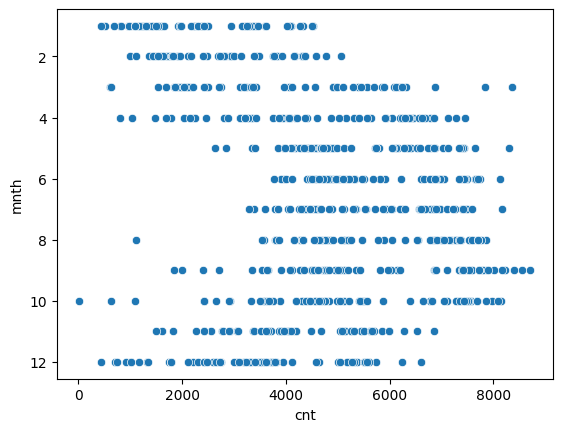

...

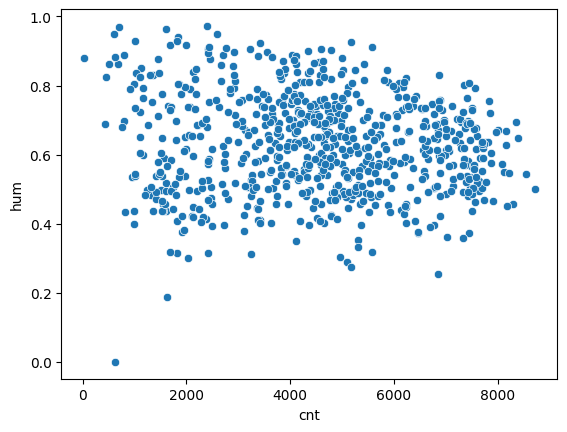

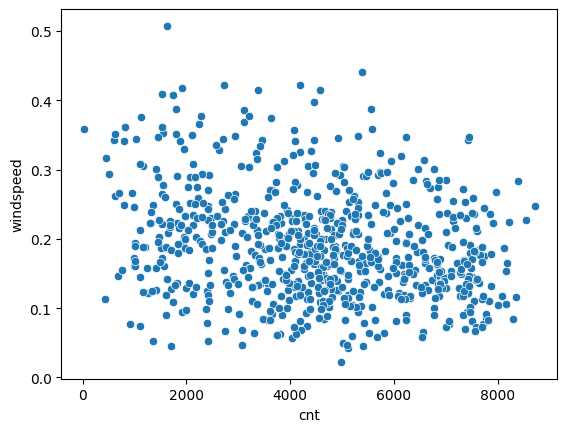

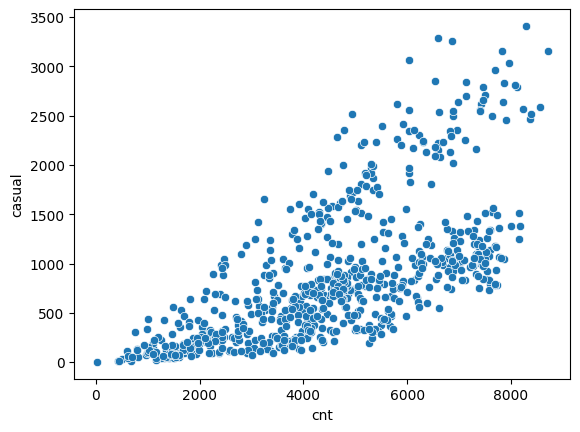

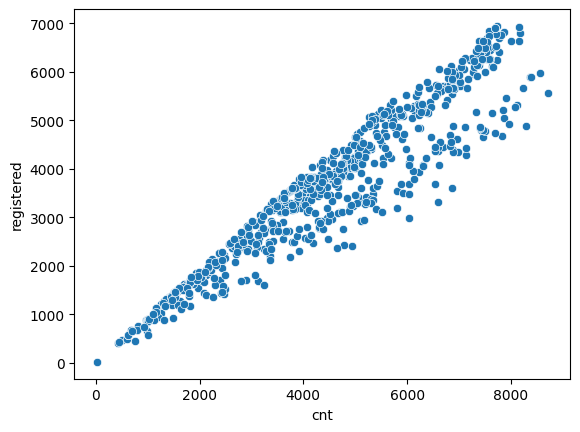

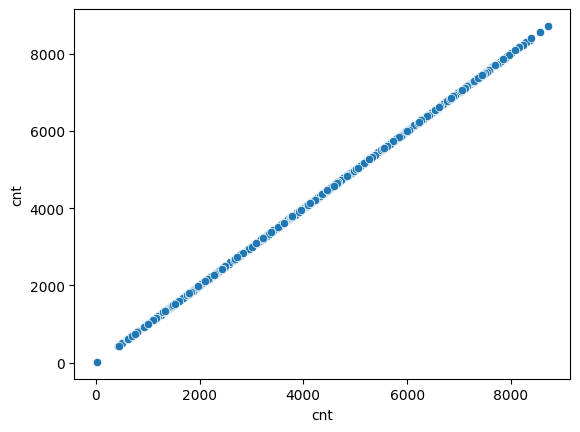

In [13]:
# visualizing relationship of variables with 'cnt'

columns = day_df.columns.values
for p in columns:
    sns.scatterplot(x='cnt',y=p, data=day_df)
    plt.show()

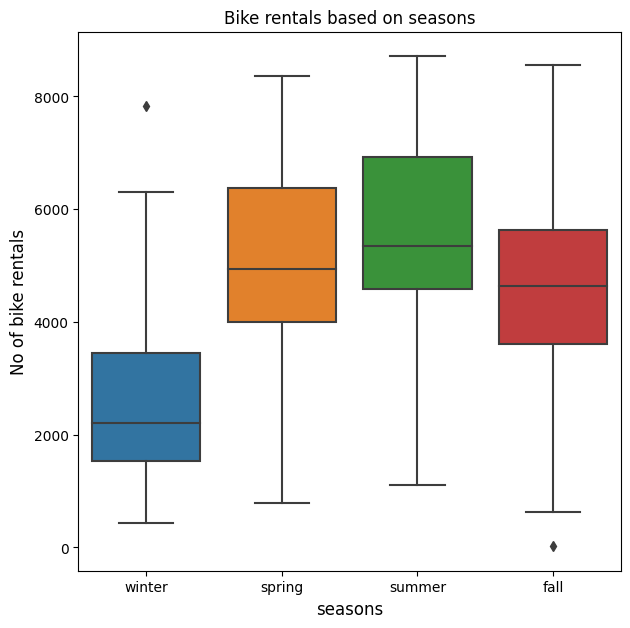

In [14]:
plt.figure(figsize=(7,7))
sns.boxplot(x='season', y='cnt', data=day_df)
plt.xlabel('seasons',fontsize=12)
plt.ylabel("No of bike rentals",fontsize=12)
plt.title("Bike rentals based on seasons",fontsize=12)
tick_val=[0,1,2,3]
tick_lab=['winter','spring','summer','fall']
plt.xticks(tick_val,tick_lab)
plt.show()

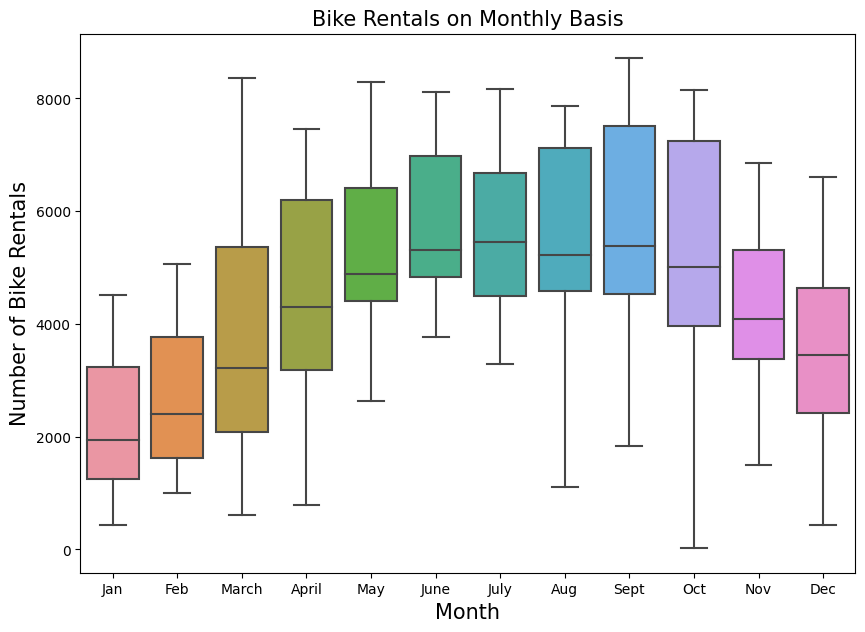

In [15]:
plt.figure(figsize=(10,7))
sns.boxplot(x='mnth', y='cnt', data=day_df)
plt.xlabel("Month",fontsize=15)
plt.ylabel("Number of Bike Rentals",fontsize=15)
plt.title("Bike Rentals on Monthly Basis",fontsize=15)
tick_val=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
tick_lab=['Jan', 'Feb', 'March', 'April', 'May', 'June', 'July', 'Aug', 'Sept', 'Oct', 'Nov', 'Dec']
plt.xticks(tick_val, tick_lab)
plt.show()

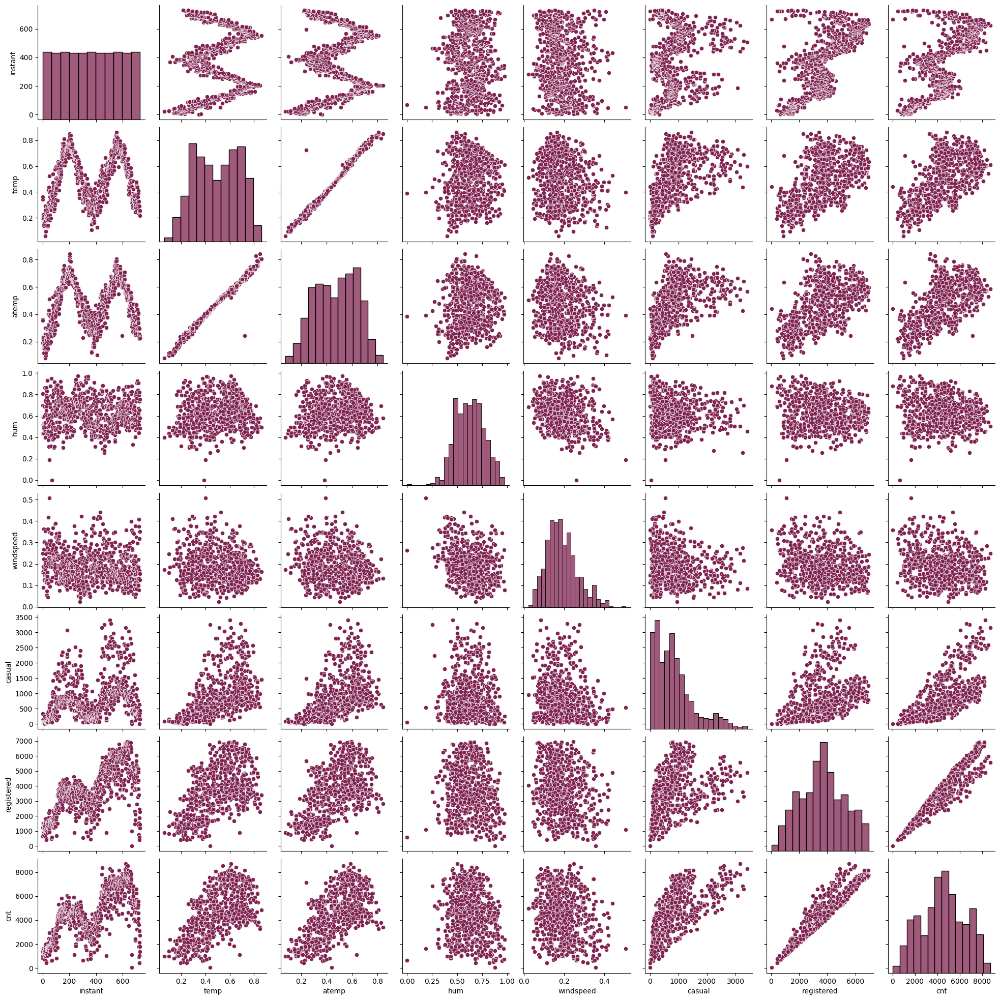

In [16]:
# pair plot
sns.set_palette('twilight_shifted_r')
sns.pairplot(day_df)

In [17]:
filepath2 = '/content/drive/MyDrive/Datasets/bike sharing dataset/hour.csv'

hour_df = pd.read_csv(filepath2)

hour_df.head(5)

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


In [18]:
# checking for null values

hour_df.isnull().sum()

instant       0
dteday        0
season        0
yr            0
mnth          0
hr            0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64

In [19]:
hour_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     17379 non-null  int64  
 1   dteday      17379 non-null  object 
 2   season      17379 non-null  int64  
 3   yr          17379 non-null  int64  
 4   mnth        17379 non-null  int64  
 5   hr          17379 non-null  int64  
 6   holiday     17379 non-null  int64  
 7   weekday     17379 non-null  int64  
 8   workingday  17379 non-null  int64  
 9   weathersit  17379 non-null  int64  
 10  temp        17379 non-null  float64
 11  atemp       17379 non-null  float64
 12  hum         17379 non-null  float64
 13  windspeed   17379 non-null  float64
 14  casual      17379 non-null  int64  
 15  registered  17379 non-null  int64  
 16  cnt         17379 non-null  int64  
dtypes: float64(4), int64(12), object(1)
memory usage: 2.3+ MB


In [20]:
 #Converting redpective variables to required data format
hour_df['dteday'] = pd.to_datetime(hour_df.dteday,yearfirst=True)
hour_df['season'] = hour_df.season.astype('category')
hour_df['yr'] = hour_df.yr.astype('category')
hour_df['mnth'] = hour_df.mnth.astype('category')
hour_df['holiday'] = hour_df.holiday.astype('category')
hour_df['weekday'] = hour_df.weekday.astype('category')
hour_df['workingday'] = hour_df.workingday.astype('category')
hour_df['weathersit'] = hour_df.weathersit.astype('category')

In [21]:
hour_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   instant     17379 non-null  int64         
 1   dteday      17379 non-null  datetime64[ns]
 2   season      17379 non-null  category      
 3   yr          17379 non-null  category      
 4   mnth        17379 non-null  category      
 5   hr          17379 non-null  int64         
 6   holiday     17379 non-null  category      
 7   weekday     17379 non-null  category      
 8   workingday  17379 non-null  category      
 9   weathersit  17379 non-null  category      
 10  temp        17379 non-null  float64       
 11  atemp       17379 non-null  float64       
 12  hum         17379 non-null  float64       
 13  windspeed   17379 non-null  float64       
 14  casual      17379 non-null  int64         
 15  registered  17379 non-null  int64         
 16  cnt         17379 non-

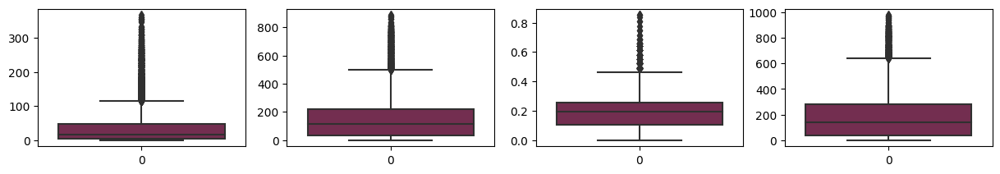

In [22]:
plt.figure(figsize=(15,10))
plt.subplot(4,4,1)
sns.boxplot(hour_df['casual']);

plt.subplot(4,4,2)
sns.boxplot(hour_df['registered']);

plt.subplot(4,4,3)
sns.boxplot(hour_df['windspeed']);

plt.subplot(4,4,4)
sns.boxplot(hour_df['cnt']);

In [23]:
hour_df['casual']=hour_df['casual'].clip(lower=hour_df['casual'].quantile(0.05),upper=hour_df['casual'].quantile(0.95))
hour_df['registered']=hour_df['registered'].clip(lower=hour_df['registered'].quantile(0.05),upper=hour_df['registered'].quantile(0.95))
hour_df['windspeed']=hour_df['windspeed'].clip(lower=hour_df['windspeed'].quantile(0.05),upper=hour_df['windspeed'].quantile(0.95))
hour_df['cnt']=hour_df['cnt'].clip(lower=hour_df['cnt'].quantile(0.05),upper=hour_df['cnt'].quantile(0.95))

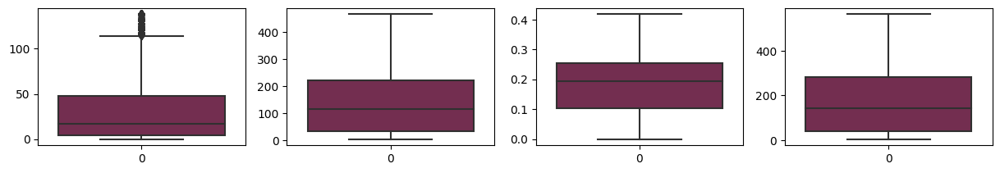

In [24]:
plt.figure(figsize=(15,10))
plt.subplot(4,4,1)
sns.boxplot(hour_df['casual']);

plt.subplot(4,4,2)
sns.boxplot(hour_df['registered']);

plt.subplot(4,4,3)
sns.boxplot(hour_df['windspeed']);

plt.subplot(4,4,4)
sns.boxplot(hour_df['cnt']);

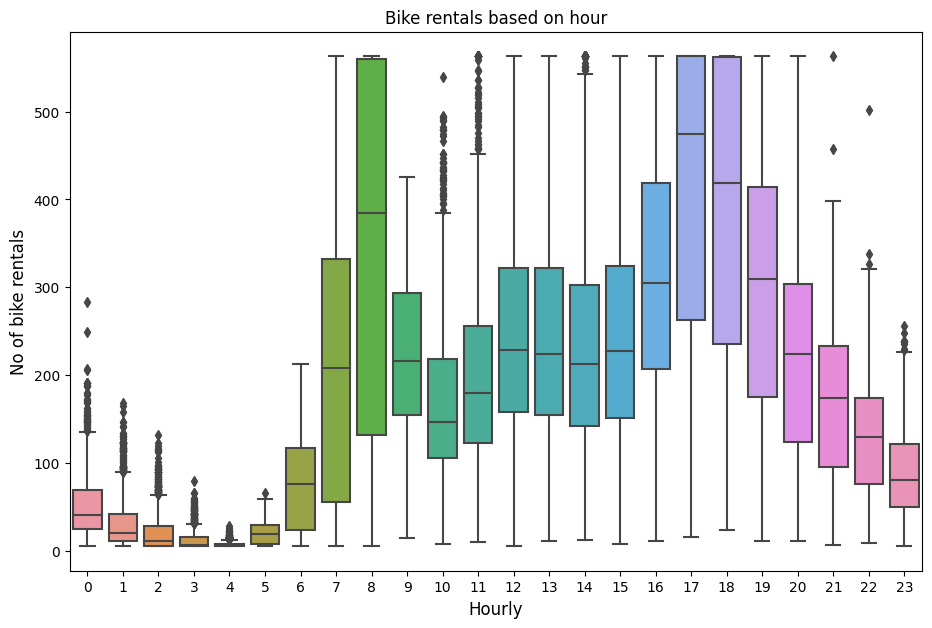

In [25]:
plt.figure(figsize=(11,7))
sns.boxplot(x='hr', y='cnt', data=hour_df)
plt.xlabel('Hourly',fontsize=12)
plt.ylabel("No of bike rentals",fontsize=12)
plt.title("Bike rentals based on hour",fontsize=12)
plt.show()

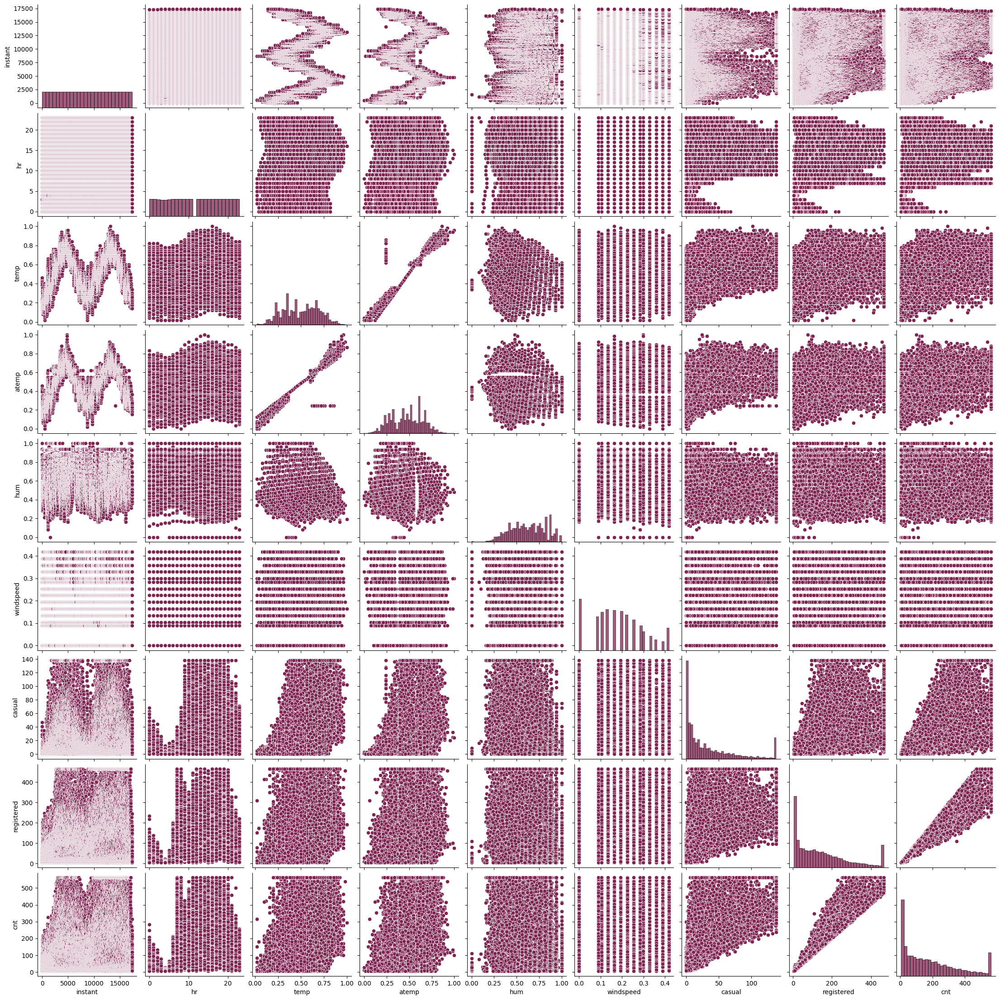

In [26]:
# pair plot
sns.set_palette('twilight_shifted_r')
sns.pairplot(hour_df)

In [27]:
day_df.corr()

,instant,temp,atemp,hum,windspeed,casual,registered,cnt
instant,1.000000,0.150580,0.152638,0.016375,-0.112620,0.275255,0.659623,0.628830
temp,0.150580,1.000000,0.991702,0.126963,-0.157944,0.543285,0.540012,0.627494
atemp,0.152638,0.991702,1.000000,0.139988,-0.183643,0.543864,0.544192,0.631066
hum,0.016375,0.126963,0.139988,1.000000,-0.248489,-0.077008,-0.091089,-0.100659
windspeed,-0.112620,-0.157944,-0.183643,-0.248489,1.000000,-0.167613,-0.217449,-0.234545
casual,0.275255,0.543285,0.543864,-0.077008,-0.167613,1.000000,0.395282,0.672804
registered,0.659623,0.540012,0.544192,-0.091089,-0.217449,0.395282,1.000000,0.945517
cnt,0.628830,0.627494,0.631066,-0.100659,-0.234545,0.672804,0.945517,1.000000


In [28]:
hour_df.corr()

,instant,hr,temp,atemp,hum,windspeed,casual,registered,cnt
instant,1.000000,-0.004775,0.136178,0.137615,0.009577,-0.074001,0.158359,0.276395,0.270375
hr,-0.004775,1.000000,0.137603,0.133750,-0.276498,0.138283,0.353093,0.408287,0.414859
temp,0.136178,0.137603,1.000000,0.987672,-0.069881,-0.016499,0.518260,0.352271,0.416205
atemp,0.137615,0.133750,0.987672,1.000000,-0.051918,-0.055760,0.511097,0.349832,0.412632
hum,0.009577,-0.276498,-0.069881,-0.051918,1.000000,-0.289348,-0.374954,-0.294980,-0.333894
windspeed,-0.074001,0.138283,-0.016499,-0.055760,-0.289348,1.000000,0.104890,0.098891,0.106321
casual,0.158359,0.353093,0.518260,0.511097,-0.374954,0.104890,1.000000,0.599831,0.749436
registered,0.276395,0.408287,0.352271,0.349832,-0.294980,0.098891,0.599831,1.000000,0.974852
cnt,0.270375,0.414859,0.416205,0.412632,-0.333894,0.106321,0.749436,0.974852,1.000000


<Axes: >

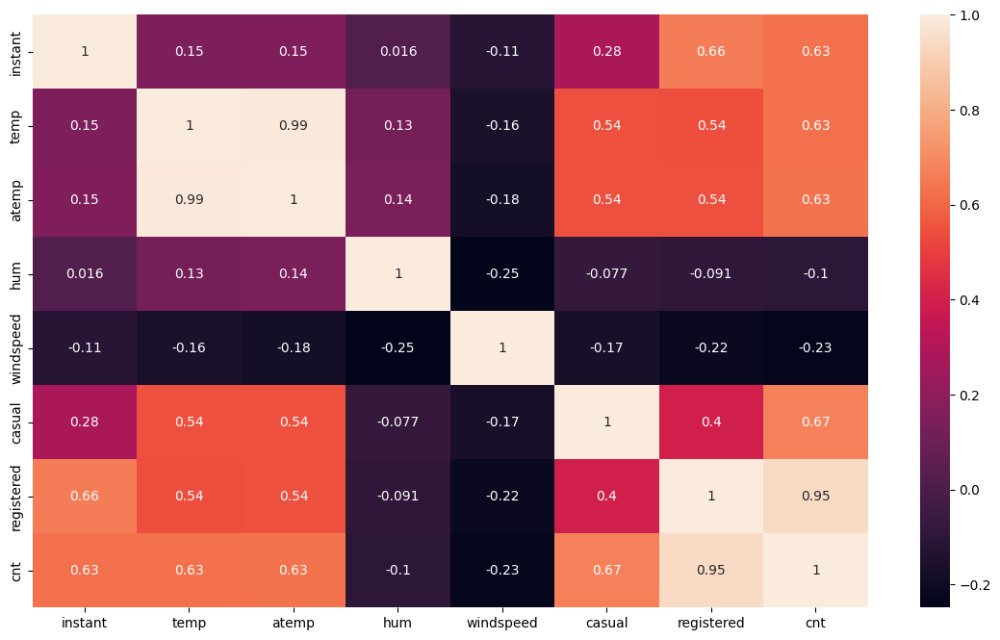

In [29]:
plt.figure(figsize=(14,8))
sns.heatmap(day_df.corr(), annot=True)

<Axes: >

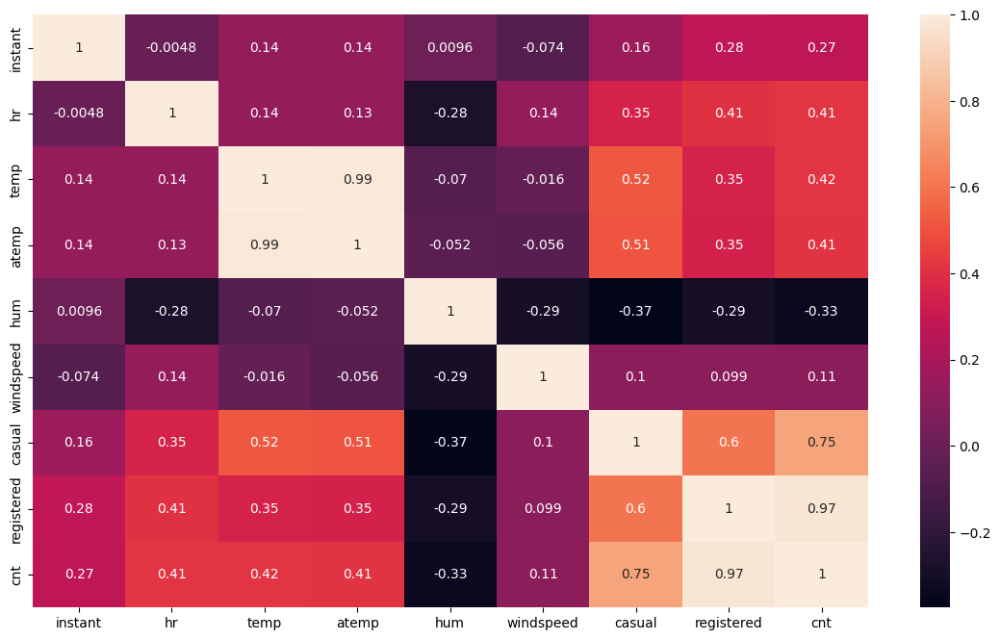

In [30]:
plt.figure(figsize=(14,8))
sns.heatmap(hour_df.corr(), annot=True)

In [31]:
day_df['year'] = day_df['dteday'].dt.year
day_df['month'] = day_df['dteday'].dt.month
day_df['day'] = day_df['dteday'].dt.day

In [32]:
hour_df['year'] = hour_df['dteday'].dt.year
hour_df['month'] = hour_df['dteday'].dt.month
hour_df['day'] = hour_df['dteday'].dt.day

In [33]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

day_df['season_encoded'] = label_encoder.fit_transform(day_df['season'])

cat_columns = ['season','yr', 'mnth', 'holiday', 'weekday','workingday','weathersit']

day_df = pd.get_dummies(day_df, columns=cat_columns, prefix=cat_columns)

In [34]:
# Create a modified DataFrame without the 'dteday' column
day_modified = day_df.drop(columns=['dteday'])

In [35]:
print(day_modified.columns)

Index(['instant', 'temp', 'atemp', 'hum', 'windspeed', 'casual', 'registered',
       'cnt', 'year', 'month', 'day', 'season_encoded', 'season_1', 'season_2',
       'season_3', 'season_4', 'yr_0', 'yr_1', 'mnth_1', 'mnth_2', 'mnth_3',
       'mnth_4', 'mnth_5', 'mnth_6', 'mnth_7', 'mnth_8', 'mnth_9', 'mnth_10',
       'mnth_11', 'mnth_12', 'holiday_0', 'holiday_1', 'weekday_0',
       'weekday_1', 'weekday_2', 'weekday_3', 'weekday_4', 'weekday_5',
       'weekday_6', 'workingday_0', 'workingday_1', 'weathersit_1',
       'weathersit_2', 'weathersit_3'],
      dtype='object')


In [36]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

hour_df['season_encoded'] = label_encoder.fit_transform(hour_df['season'])

cat_columns = ['season','yr','mnth', 'holiday','weekday', 'workingday','weathersit']

hour_df = pd.get_dummies(hour_df, columns=cat_columns, prefix=cat_columns)

In [37]:
# Create a modified DataFrame without the 'dteday' column
hourly_modified = hour_df.drop(columns=['dteday'])

In [38]:
print(hourly_modified.columns)

Index(['instant', 'hr', 'temp', 'atemp', 'hum', 'windspeed', 'casual',
       'registered', 'cnt', 'year', 'month', 'day', 'season_encoded',
       'season_1', 'season_2', 'season_3', 'season_4', 'yr_0', 'yr_1',
       'mnth_1', 'mnth_2', 'mnth_3', 'mnth_4', 'mnth_5', 'mnth_6', 'mnth_7',
       'mnth_8', 'mnth_9', 'mnth_10', 'mnth_11', 'mnth_12', 'holiday_0',
       'holiday_1', 'weekday_0', 'weekday_1', 'weekday_2', 'weekday_3',
       'weekday_4', 'weekday_5', 'weekday_6', 'workingday_0', 'workingday_1',
       'weathersit_1', 'weathersit_2', 'weathersit_3', 'weathersit_4'],
      dtype='object')


In [39]:
# Define features and target variable for Day data and Hourly data
day_features = [col for col in day_modified.columns if col != 'cnt']
hourly_features = [col for col in hourly_modified.columns if col != 'cnt']

In [40]:
from sklearn.model_selection import train_test_split

# Split the data into train and test sets for day_df
X_day = day_modified.drop('cnt', axis=1)
y_day = day_modified['cnt']

X_day_train, X_day_test, y_day_train, y_day_test = train_test_split(X_day, y_day, test_size=0.2, random_state=42)

# Split the data into train and test sets for hour_df
X_hour = hourly_modified.drop('cnt', axis=1)
y_hour = hourly_modified['cnt']

X_hour_train, X_hour_test, y_hour_train, y_hour_test = train_test_split(X_hour, y_hour, test_size=0.2, random_state=42)

In [41]:
# Train XGBoost model for Day data

import xgboost as xgb
day_xgb = xgb.XGBRegressor(n_estimators=100, max_depth=6, random_state=42)
day_xgb.fit(X_day_train[day_features], y_day_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=42, ...)

In [42]:
# Train XGBoost model for Hourly data
hourly_xgb = xgb.XGBRegressor(n_estimators=100, max_depth=6, random_state=42)
hourly_xgb.fit(X_hour_train[hourly_features], y_hour_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=42, ...)

In [43]:
# Calculate predictions for Day and Hourly data
day_predictions = day_xgb.predict(X_day_test)
day_predictions

array([6637.6836 , 1571.9215 , 3846.57   , 6022.0903 , 7611.865  ,
       7250.152  , 1546.0881 , 2025.1113 , 7578.5923 , 5445.8315 ,
       1867.6177 , 3020.8767 , 4986.6143 , 5350.6714 , 2178.1475 ,
       2522.781  , 2092.1667 , 7951.559  , 5546.1885 , 2346.3213 ,
       7634.739  , 5275.0303 , 5299.113  , 1908.3431 , 1830.7904 ,
       4980.1016 , 2102.2148 , 7475.302  , 3762.9622 , 5584.1113 ,
       2684.8325 , 3660.4543 , 6315.875  , 7462.518  , 5964.8057 ,
       3576.92   , 7603.599  , 5979.323  , 2715.3188 , 1391.0692 ,
       3804.155  , 3791.8086 , 7533.07   , 4915.4536 , 6990.1196 ,
        772.4876 , 4583.142  , 5332.7563 , 5746.767  , 4979.83   ,
       3084.9565 , 2416.3542 ,  964.34674, 4580.7427 , 4706.293  ,
       4710.925  , 2422.218  , 3298.9465 , 4822.779  , 7023.0244 ,
       6257.128  , 7312.283  , 1524.2461 , 8016.368  , 6479.5474 ,
       6419.831  , 7475.2607 , 4256.4883 , 2138.4355 , 7092.8325 ,
       2892.1653 , 1264.3505 , 3852.216  , 4504.971  , 4346.76

In [44]:
hourly_predictions = hourly_xgb.predict(X_hour_test)
hourly_predictions

array([419.26086 ,  87.75261 ,   5.252154, ...,  96.8475  , 266.6295  ,
       264.1942  ], dtype=float32)

In [45]:
# Calculate Mean Squared Error (MSE) for Day and Hourly data
day_mse = mean_squared_error(y_day_test, day_predictions)
hourly_mse = mean_squared_error(y_hour_test, hourly_predictions)

print(f"Day Data MSE: {day_mse}")
print(f"Hourly Data MSE: {hourly_mse}")

Day Data MSE: 17741.25091728062
Hourly Data MSE: 39.24588110582425


In [46]:
from sklearn.ensemble import RandomForestRegressor

# Train the model on training data
day_rf = RandomForestRegressor(n_estimators=100, random_state=42)
day_rf.fit(X_day_train, y_day_train)

# Train the model on hourly data
hour_rf = RandomForestRegressor(n_estimators=100, random_state=42)
hour_rf.fit(X_hour_train, y_hour_train)


RandomForestRegressor(random_state=42)

In [47]:
# Use the forest's predict method on the test data
day_predictions = day_rf.predict(X_day_test)
hour_predictions = hour_rf.predict(X_hour_test)

In [48]:
rf_day_score = day_rf.score(X_day_train,y_day_train)
print('Accuracy of the day data :',rf_day_score)

rf_hour_score = hour_rf.score(X_hour_train,y_hour_train)
print('Accuracy of the hour data :',rf_hour_score)

Accuracy of the day data : 0.9993162865868854
Accuracy of the hour data : 0.9997649180157192


In [49]:
rf_day_pred = day_rf.predict(X_day_test)

rf_hour_pred = hour_rf.predict(X_hour_test)

In [50]:
#Root mean square error
import math
from sklearn import preprocessing,metrics
rmse = math.sqrt(metrics.mean_squared_error(y_day_test,rf_day_pred))
print('Root mean square error for day data :',rmse)

# Mean absolute error
mae = metrics.mean_absolute_error(y_day_test,rf_day_pred)
print('Mean absolute error for day data :',mae)

Root mean square error for day data : 105.65212680925893
Mean absolute error for day data : 67.60857142857144


In [51]:
#Root mean square error

rmse = math.sqrt(metrics.mean_squared_error(y_hour_test,rf_hour_pred))
print('Root mean square error for hour data :',rmse)

# Mean absolute error
mae = metrics.mean_absolute_error(y_hour_test,rf_hour_pred)
print('Mean absolute error for hour data :',mae)

Root mean square error for hour data : 5.901886905853229
Mean absolute error for hour data : 1.6397894131185176


In [52]:
!pip install h2o

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 240.9/240.9 MB 2.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for h2o: filename=h2o-3.42.0.3-py2.py3-none-any.whl size=240945068 sha256=3fdde2452cf20e7ea6547068e323787881630beed41a7a7789dadb8b803ac51f
  Stored in directory: /root/.cache/pip/wheels/f9/7d/1d/e1258f0558603969a8393cb5b22a18e313337f01627a118302
Successfully built h2o


In [53]:
# importing h2o libraies

import h2o
from h2o.automl import H2OAutoML

import warnings
warnings.filterwarnings('ignore')

In [54]:
# Loading the Data Set using h2o

filepath1 = '/content/drive/MyDrive/Datasets/bike sharing dataset/day.csv'

filepath2 = '/content/drive/MyDrive/Datasets/bike sharing dataset/hour.csv'

In [55]:
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.20.1" 2023-08-24; OpenJDK Runtime Environment (build 11.0.20.1+1-post-Ubuntu-0ubuntu122.04); OpenJDK 64-Bit Server VM (build 11.0.20.1+1-post-Ubuntu-0ubuntu122.04, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp2ecli7fm
  JVM stdout: /tmp/tmp2ecli7fm/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp2ecli7fm/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,07 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.42.0.3
H2O_cluster_version_age:,12 days
H2O_cluster_name:,H2O_from_python_unknownUser_oduh04
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.170 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [56]:
day_df = h2o.import_file(filepath1)
day_df.head(5)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
1,2011-01-01 00:00:00,1,0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985
2,2011-01-02 00:00:00,1,0,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801
3,2011-01-03 00:00:00,1,0,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349
4,2011-01-04 00:00:00,1,0,1,0,2,1,1,0.2,0.212122,0.590435,0.160296,108,1454,1562
5,2011-01-05 00:00:00,1,0,1,0,3,1,1,0.226957,0.22927,0.436957,0.1869,82,1518,1600


In [57]:
hour_df = h2o.import_file(filepath2)
hour_df.head(5)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
1,2011-01-01 00:00:00,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0,3,13,16
2,2011-01-01 00:00:00,1,0,1,1,0,6,0,1,0.22,0.2727,0.8,0,8,32,40
3,2011-01-01 00:00:00,1,0,1,2,0,6,0,1,0.22,0.2727,0.8,0,5,27,32
4,2011-01-01 00:00:00,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0,3,10,13
5,2011-01-01 00:00:00,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0,0,1,1


In [58]:
# Split the data into train and test sets

day_train, day_test = day_df.split_frame(ratios=[0.8], seed=42)
hourly_train, hourly_test = hour_df.split_frame(ratios=[0.8], seed=42)

In [59]:
# Train AutoML models for Day data

day_automl = H2OAutoML(max_runtime_secs=60, seed=1)
day_automl.train(y='cnt',training_frame=day_train)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),4/8
# GBM base models (used / total),2/4
# XGBoost base models (used / total),2/2
# DRF base models (used / total),0/1
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5
Metalearner fold_column,None


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_BestOfFamily_2_AutoML_1_20230904_142945,109.817,12059.8,75.9259,0.0254527,12059.8,301,0.168272,StackedEnsemble
StackedEnsemble_BestOfFamily_3_AutoML_1_20230904_142945,109.817,12059.8,75.9292,0.0254551,12059.8,263,0.183161,StackedEnsemble
StackedEnsemble_AllModels_2_AutoML_1_20230904_142945,110.613,12235.3,74.8093,0.0243677,12235.3,301,0.384827,StackedEnsemble
StackedEnsemble_AllModels_1_AutoML_1_20230904_142945,110.626,12238.1,74.7371,0.0243732,12238.1,382,0.233081,StackedEnsemble
GBM_3_AutoML_1_20230904_142945,121.341,14723.6,78.929,0.0253599,14723.6,678,0.037648,GBM
XGBoost_2_AutoML_1_20230904_142945,132.059,17439.5,100.183,0.0319544,17439.5,944,0.01046,XGBoost
GBM_4_AutoML_1_20230904_142945,145.563,21188.5,100.753,0.0354751,21188.5,1070,0.170904,GBM
StackedEnsemble_BestOfFamily_1_AutoML_1_20230904_142945,164.668,27115.7,125.457,0.047555,27115.7,448,0.236643,StackedEnsemble
XGBoost_1_AutoML_1_20230904_142945,170.182,28961.8,127.574,0.0513278,28961.8,2269,0.030081,XGBoost
GBM_2_AutoML_1_20230904_142945,181.189,32829.3,120.818,0.0413326,32829.3,762,0.035083,GBM


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

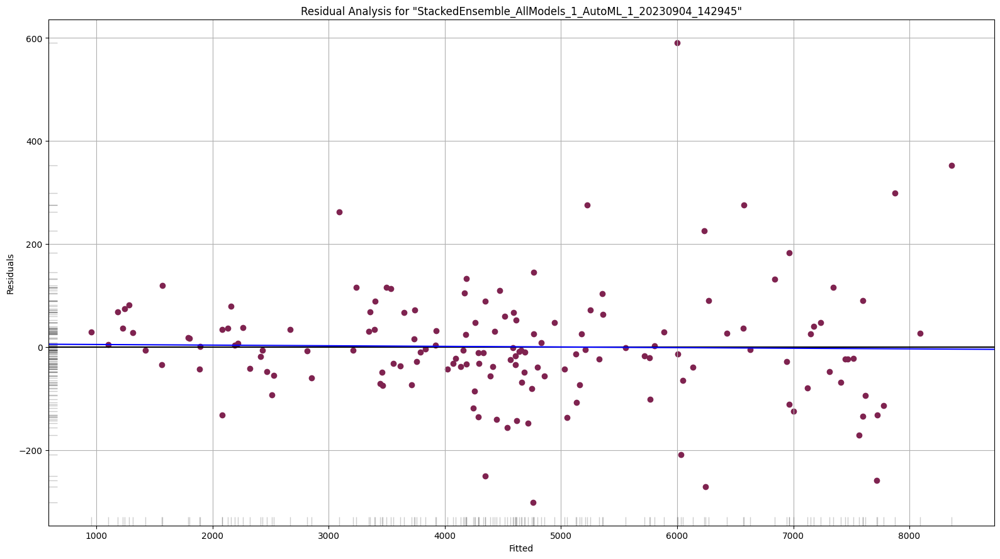

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

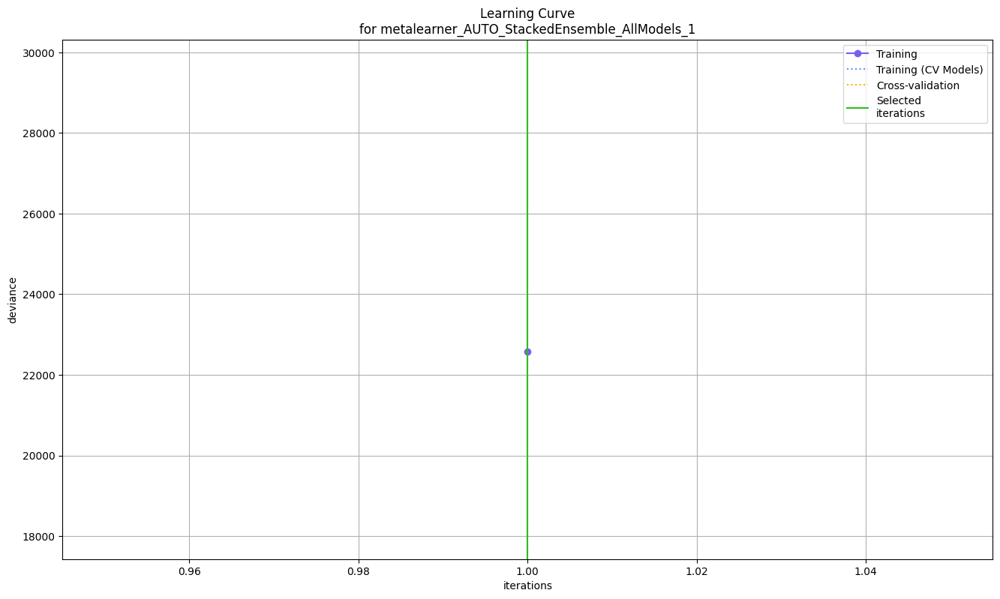

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

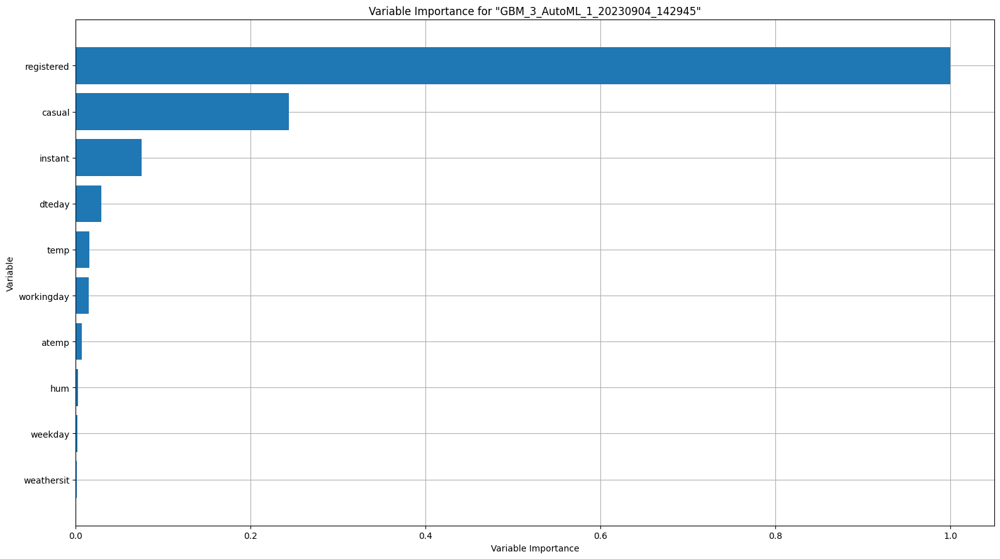

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

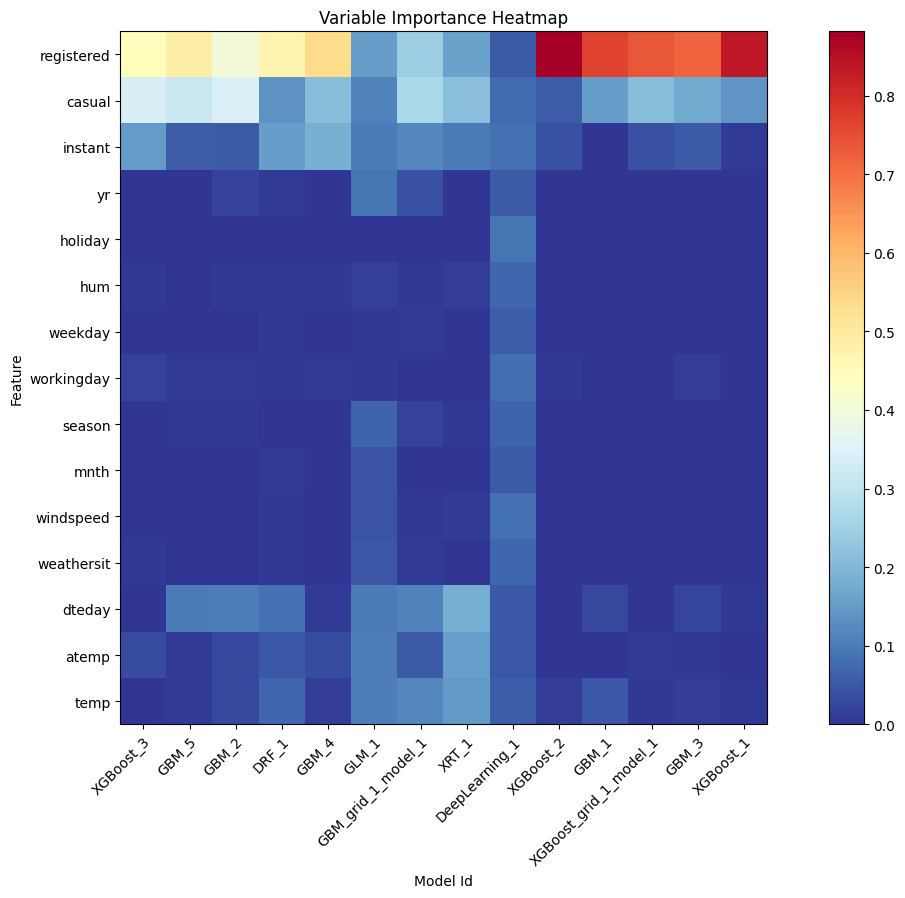

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

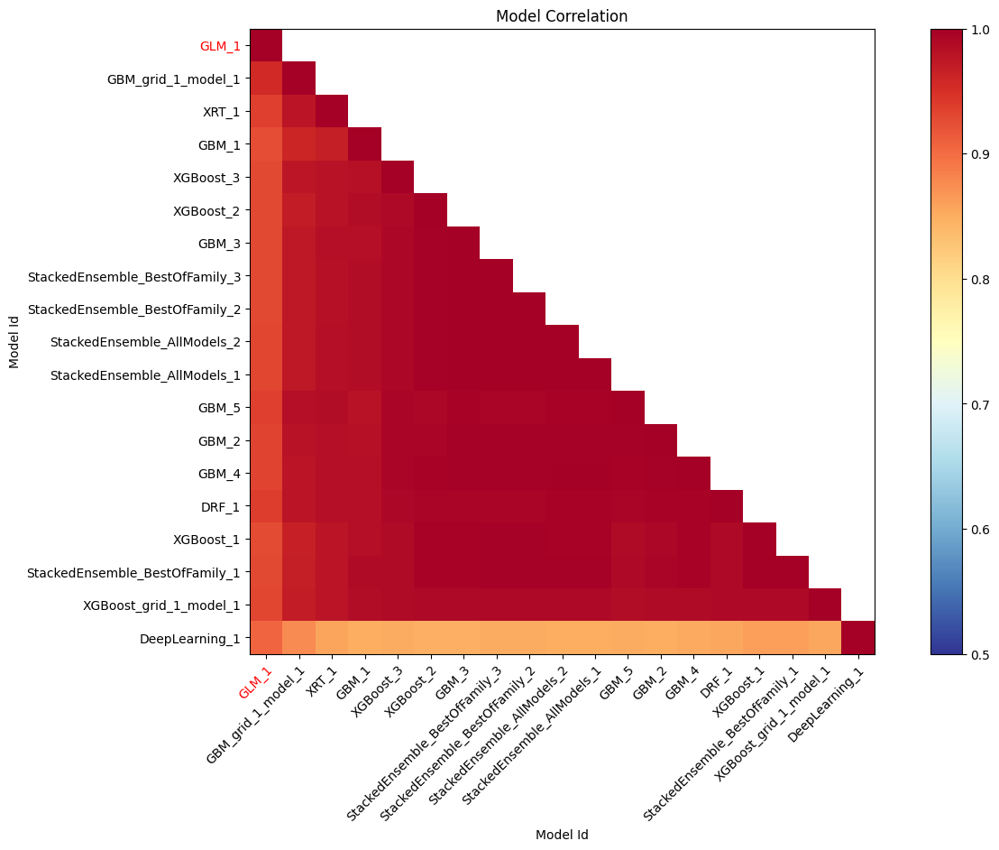

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

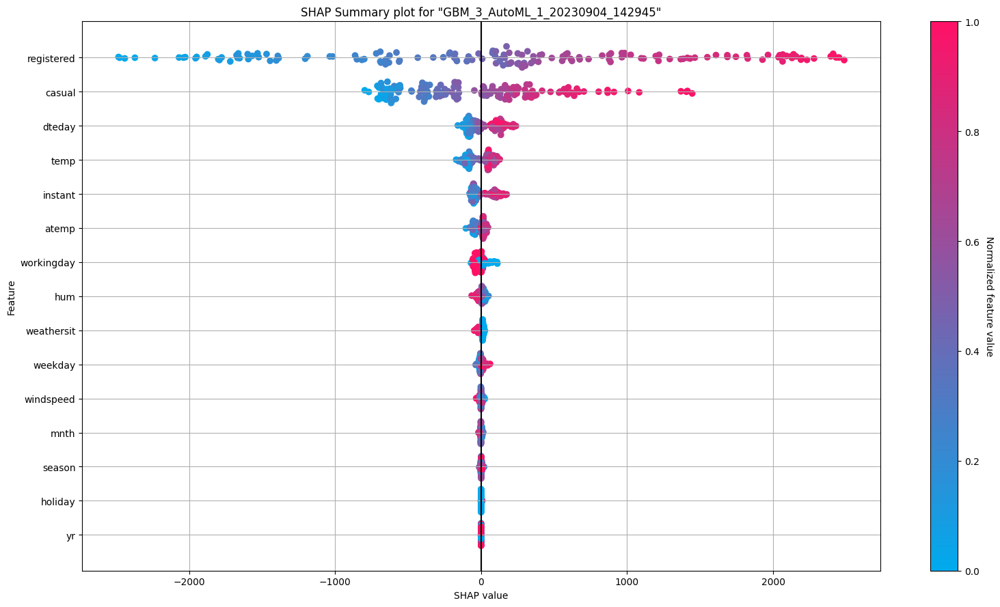

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

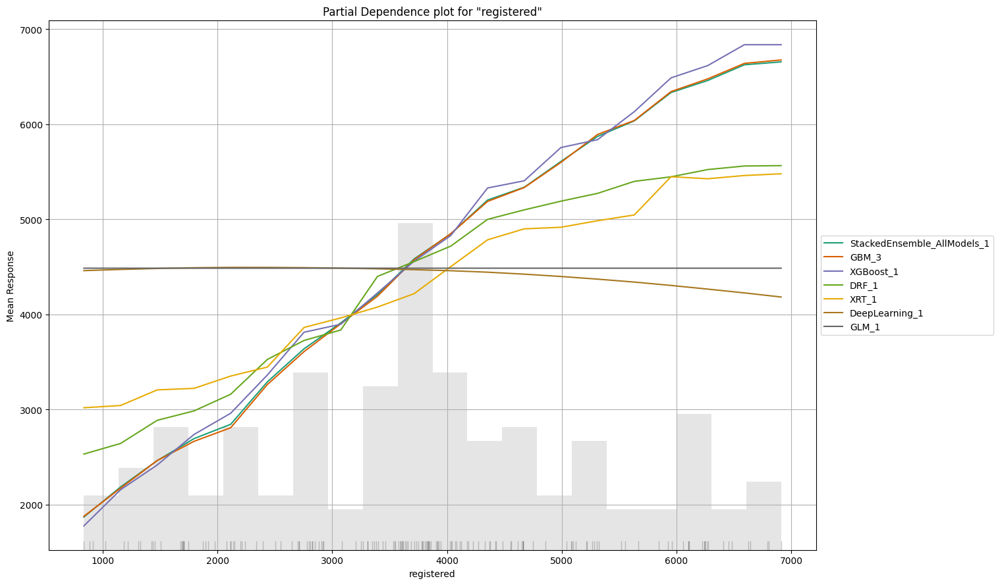

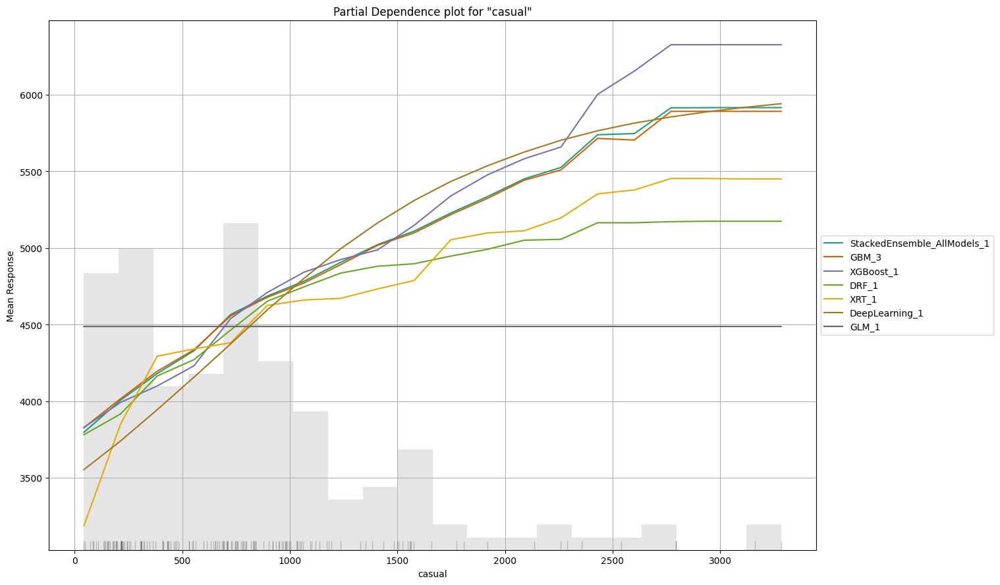

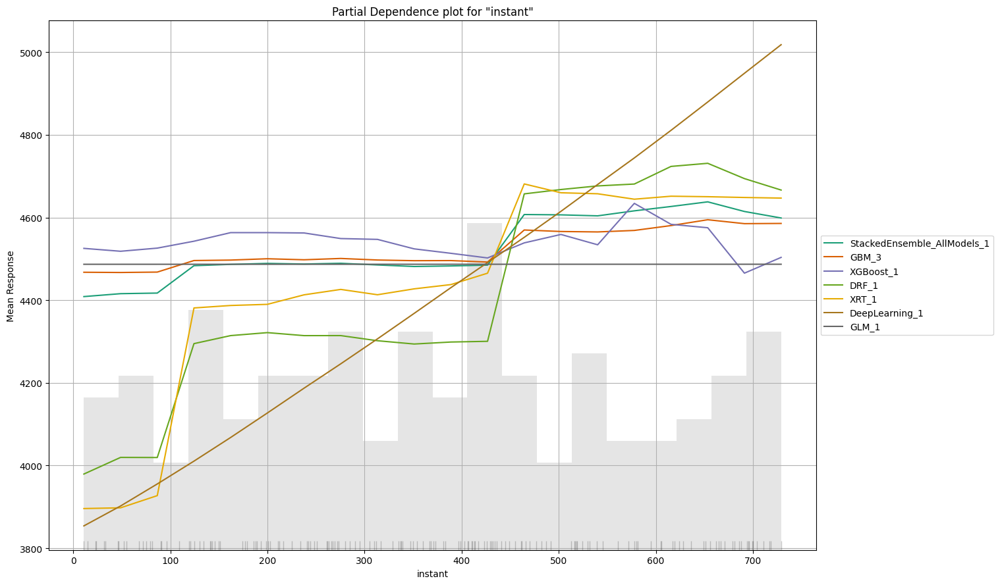

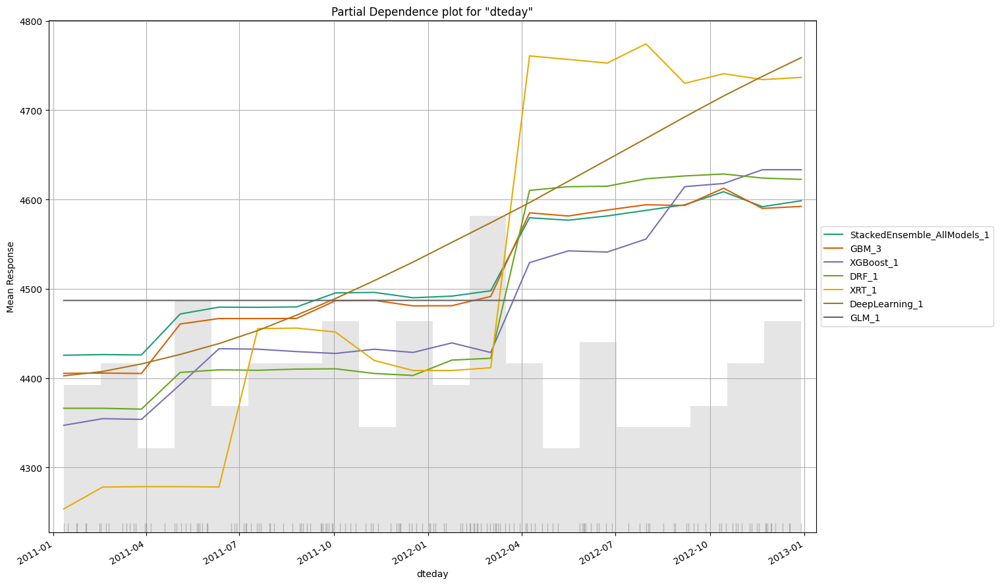

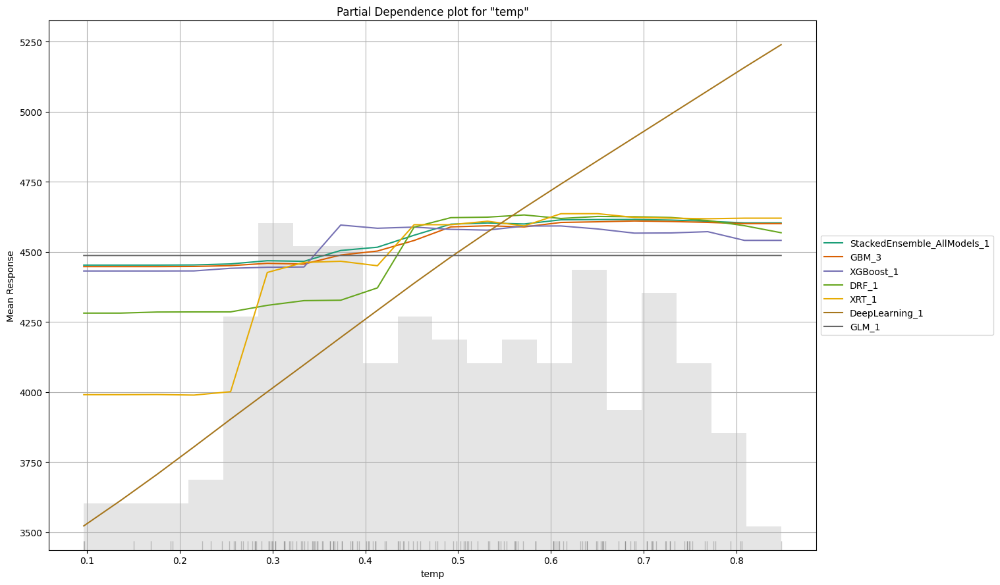

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

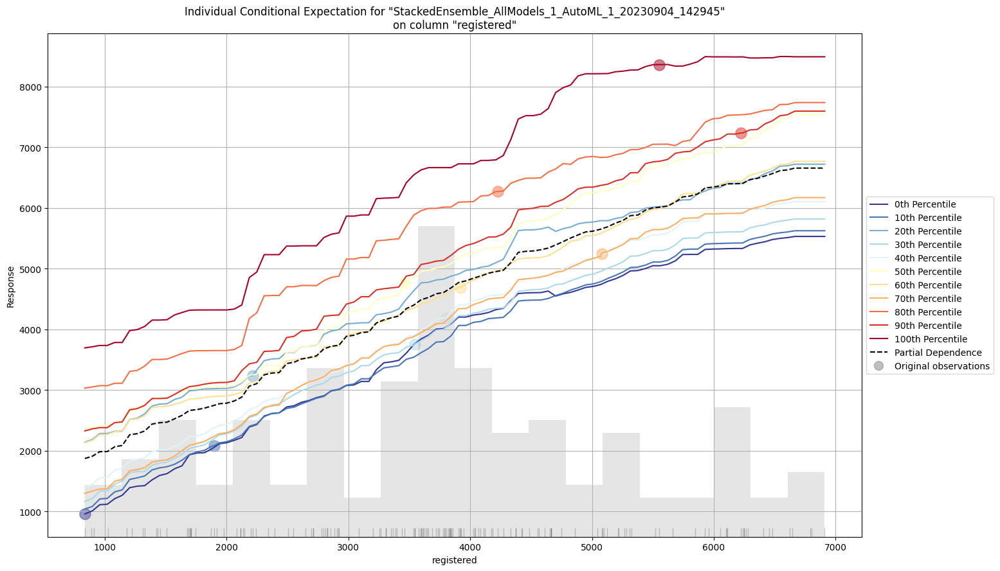

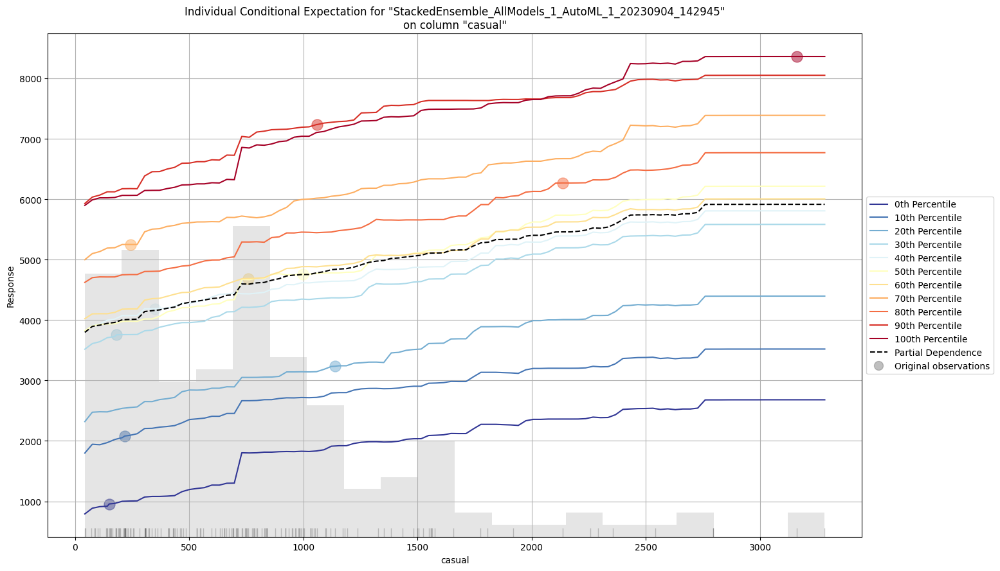

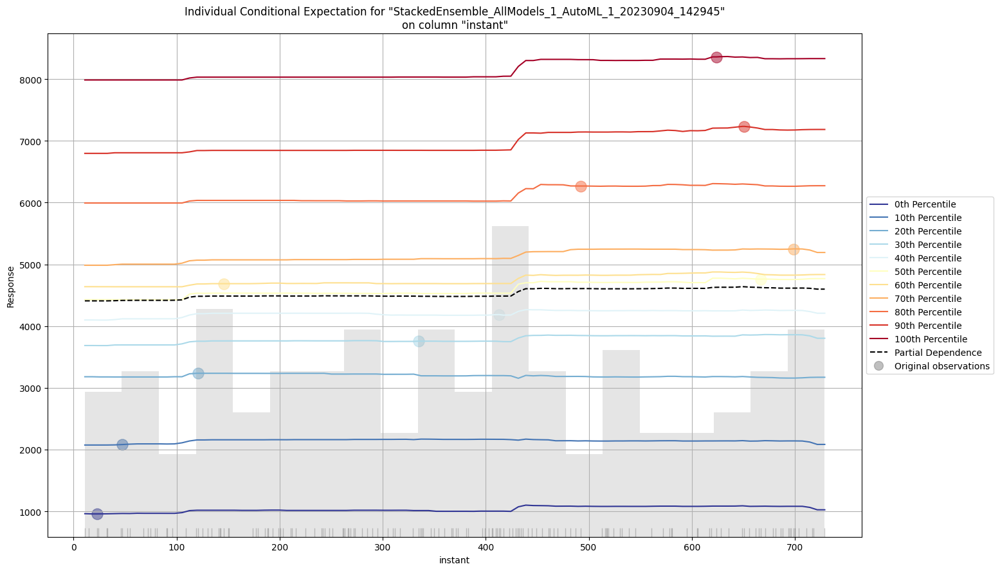

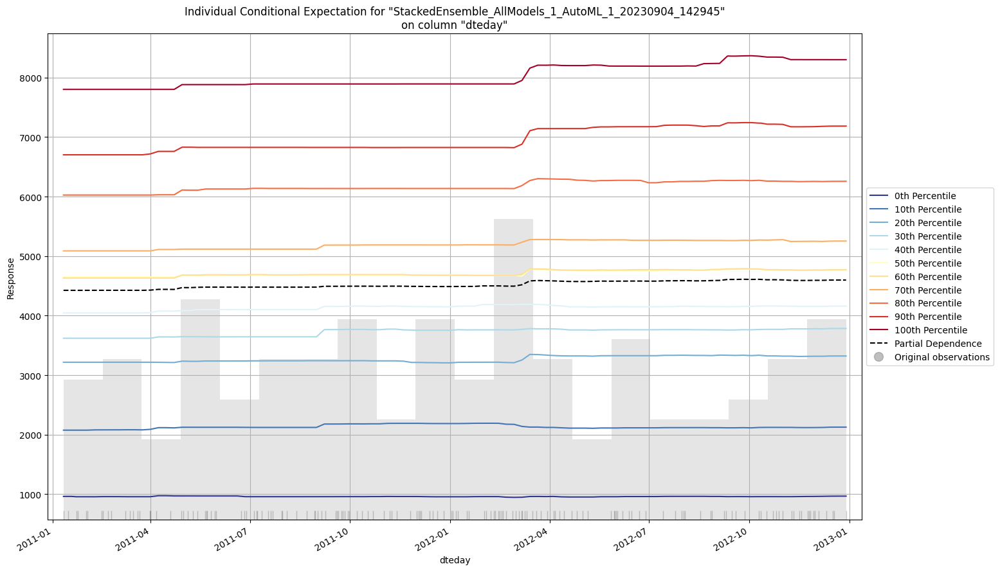

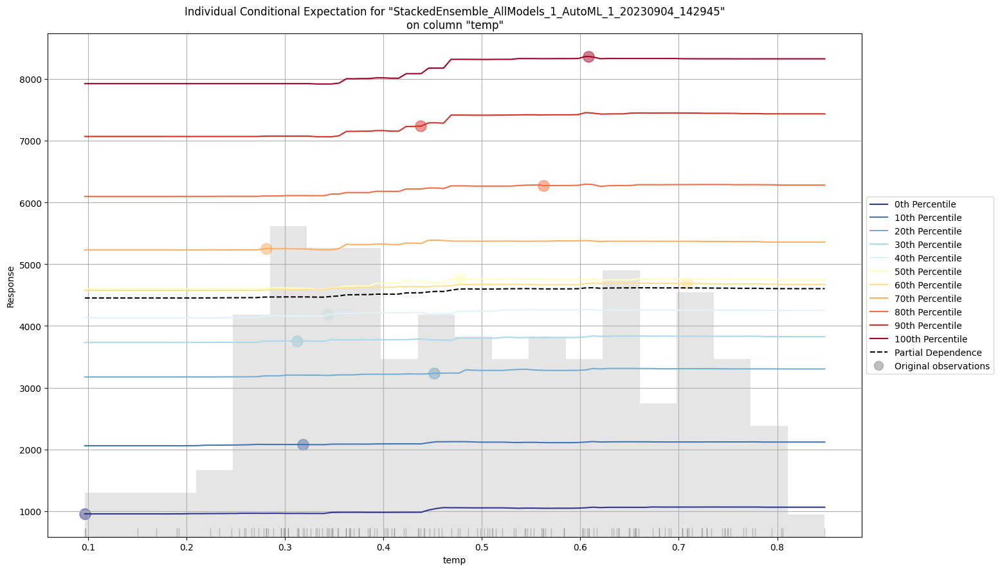

In [60]:
# Explain leader model & compare with all AutoML models
exa_day = day_automl.explain(day_test)


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

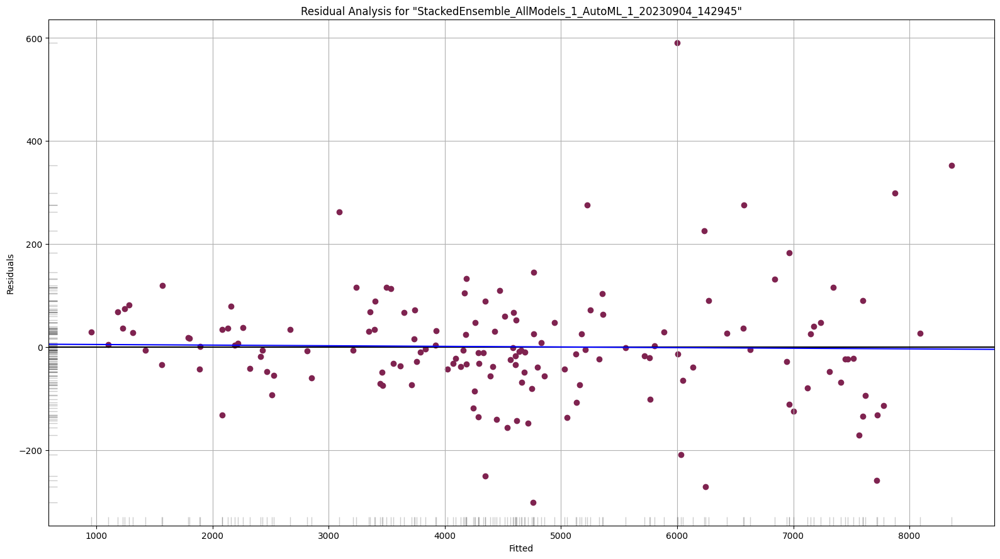

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

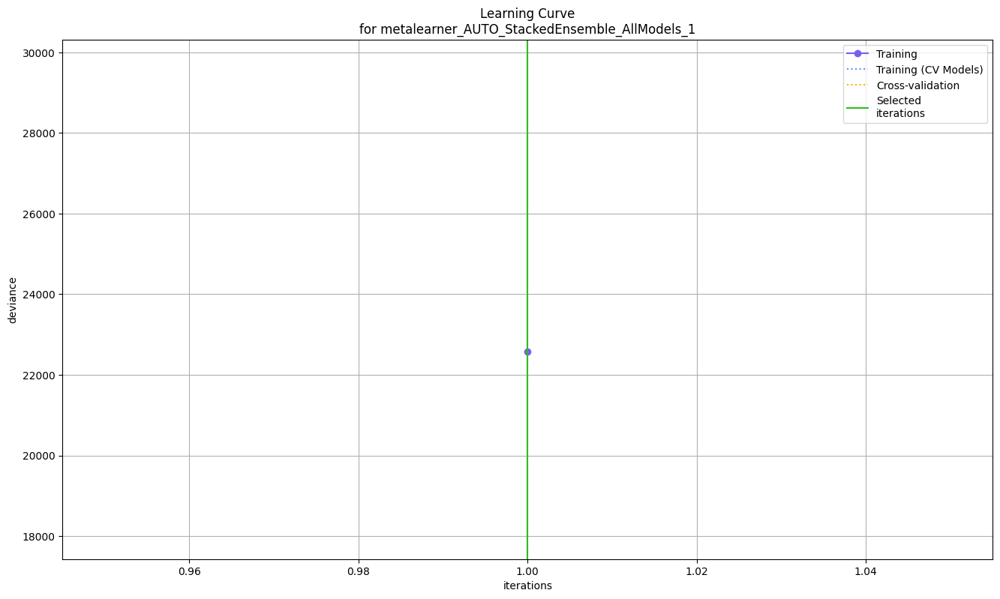

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

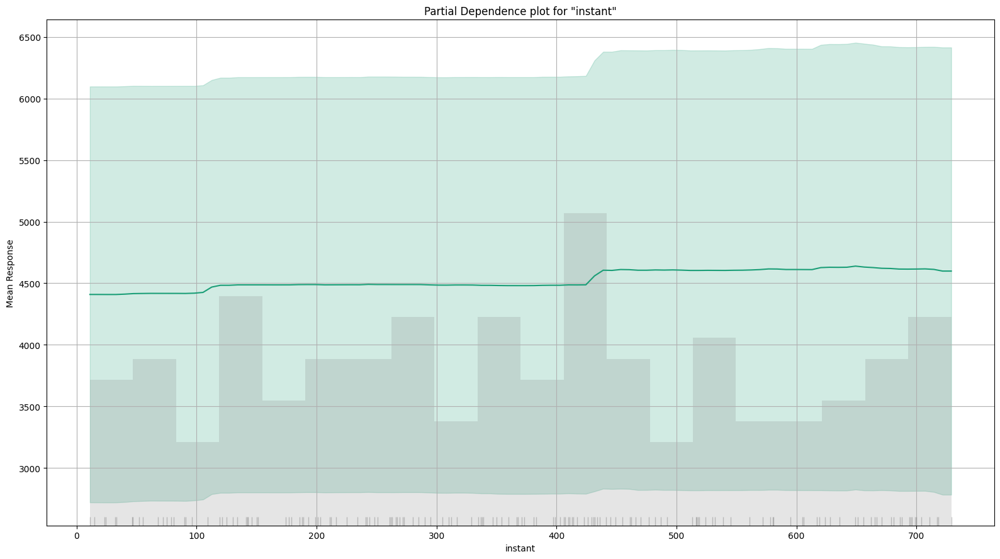

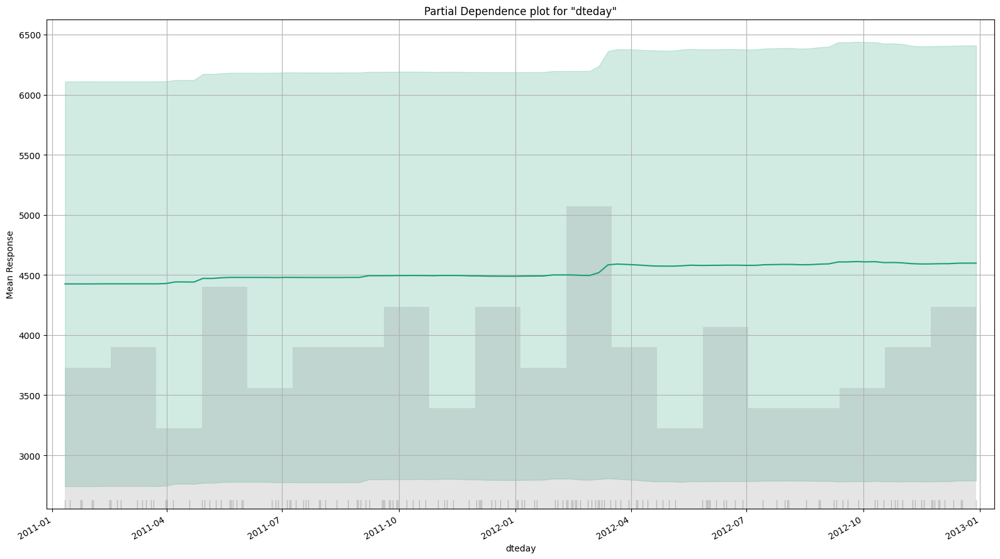

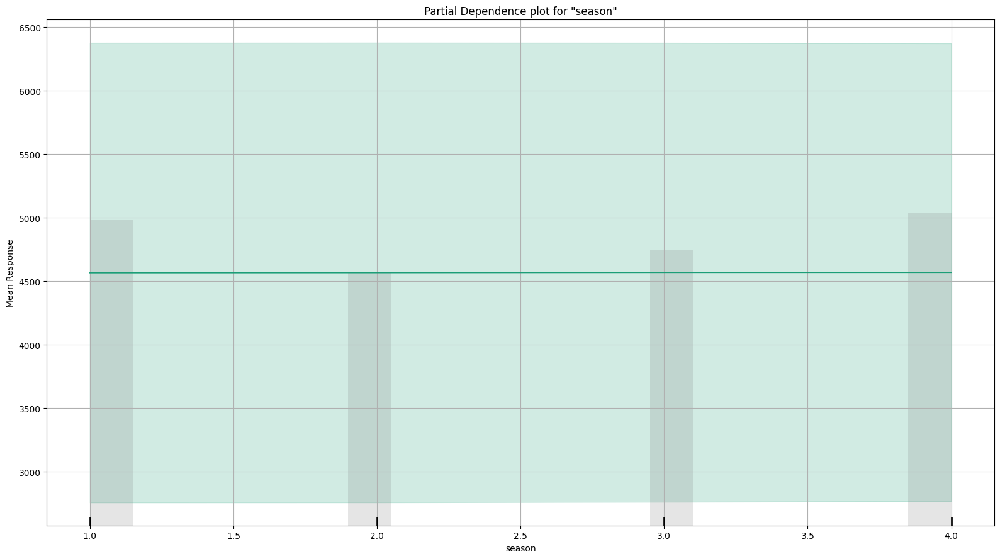

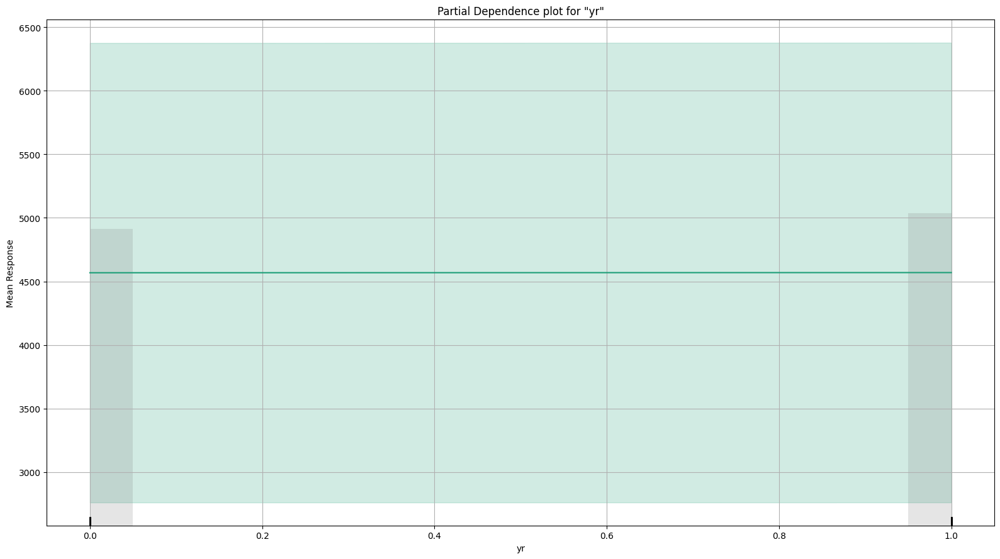

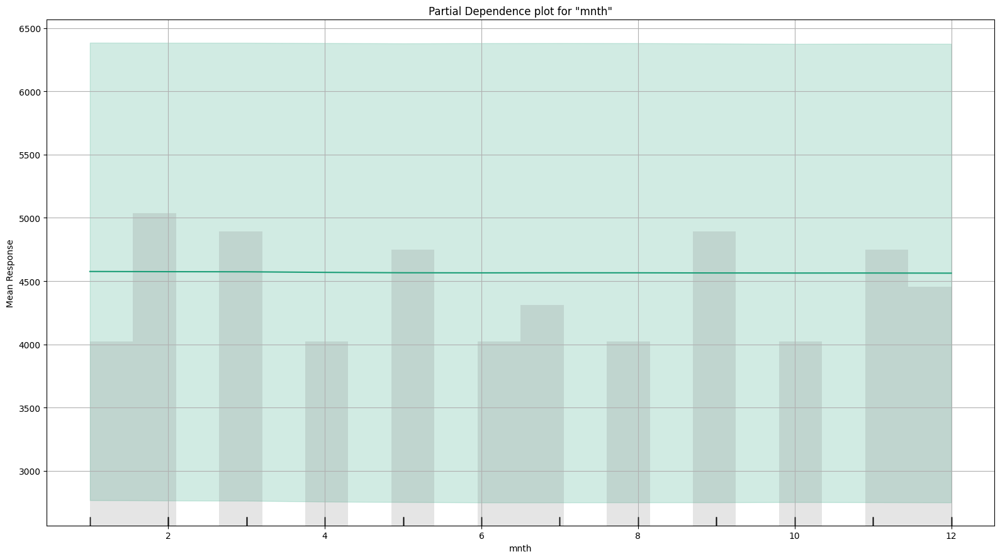

...

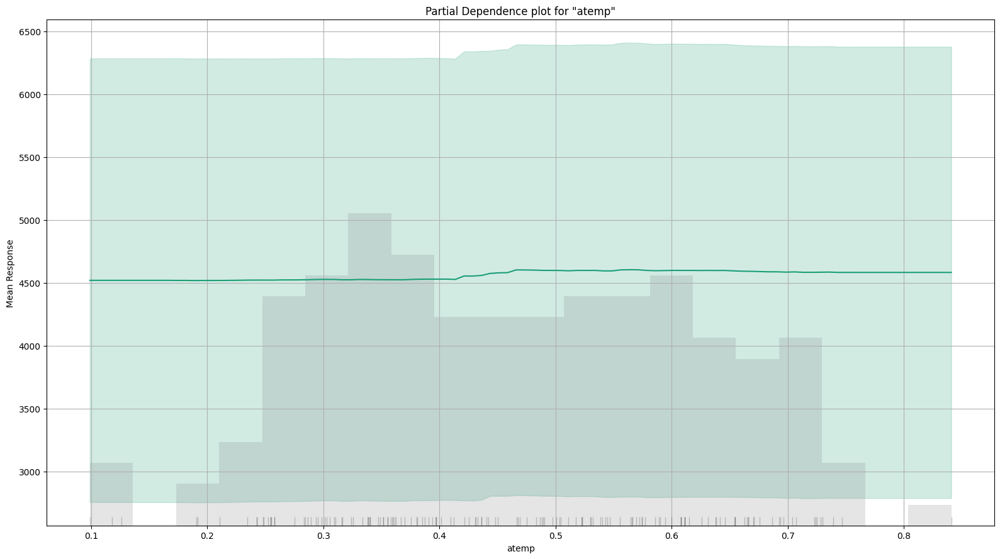

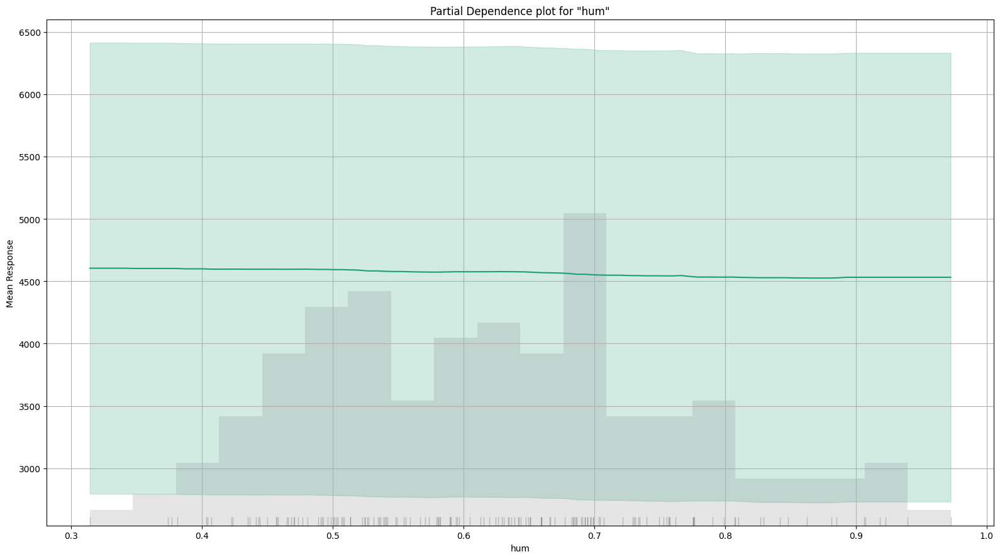

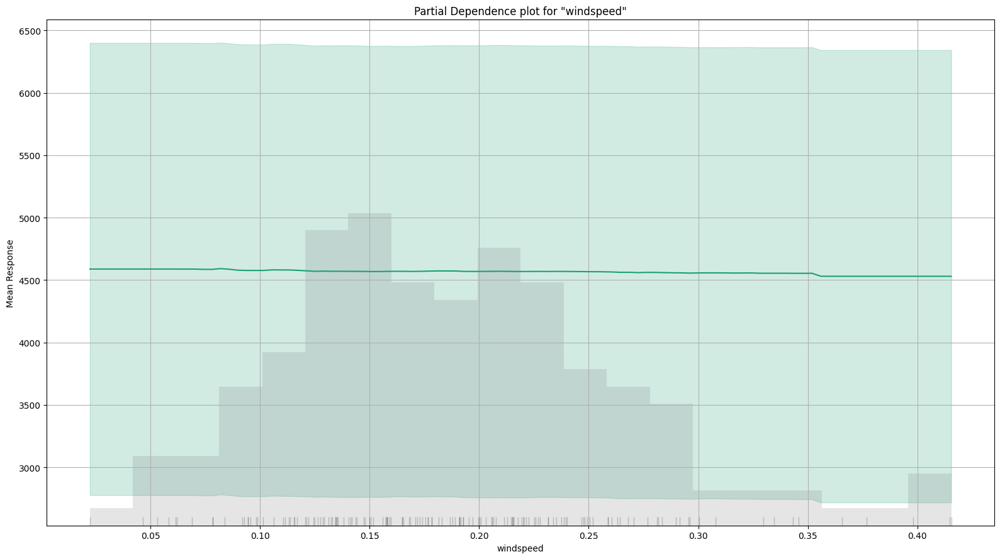

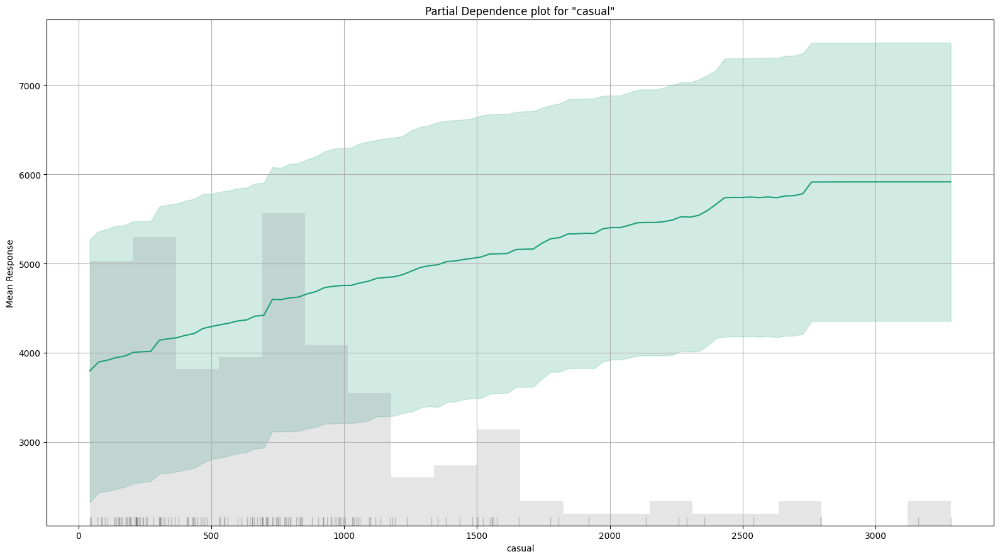

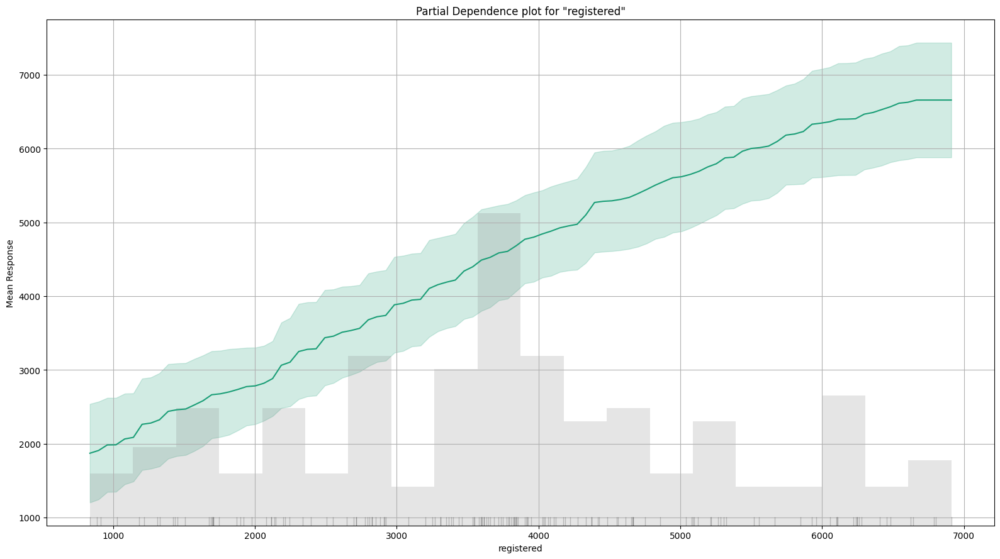

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

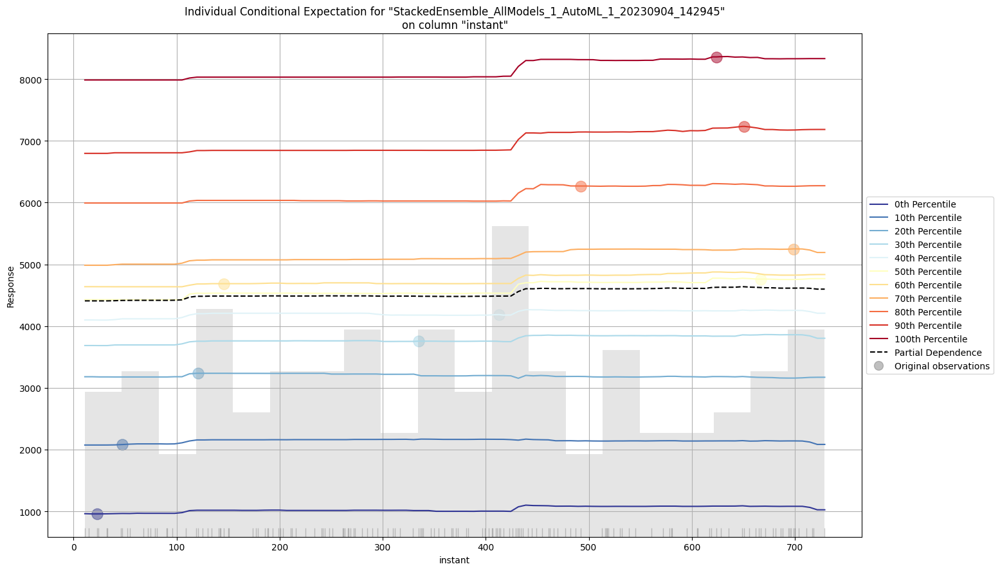

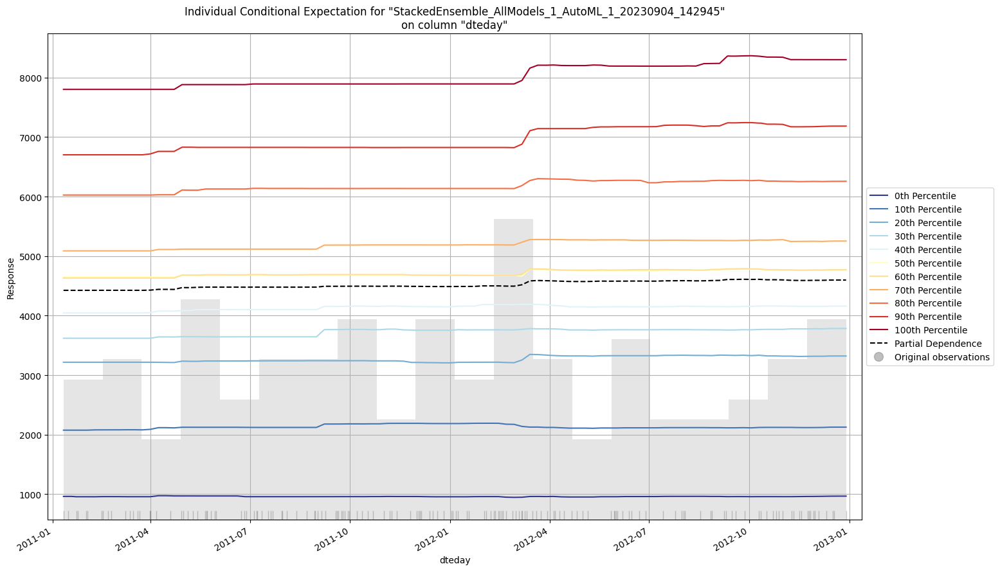

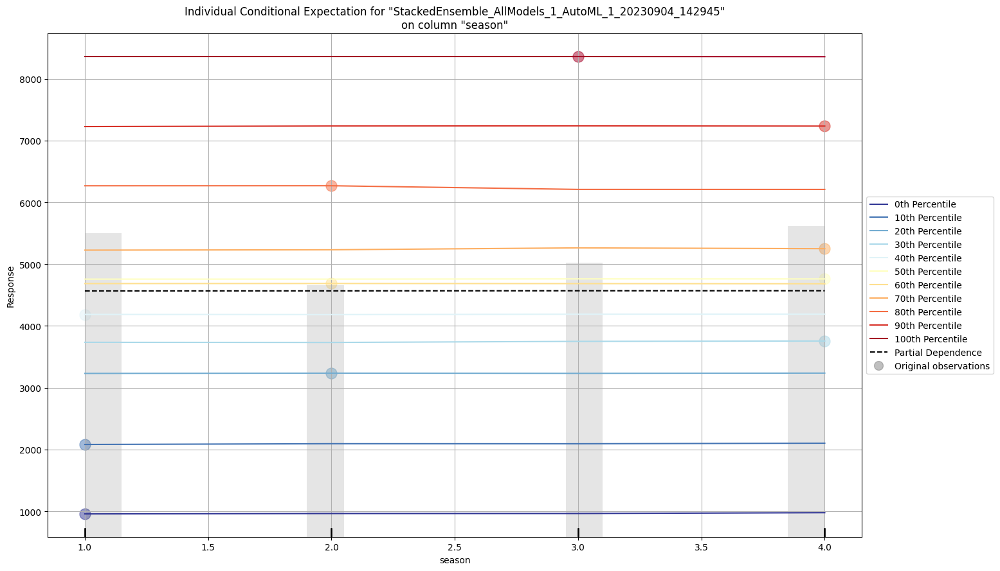

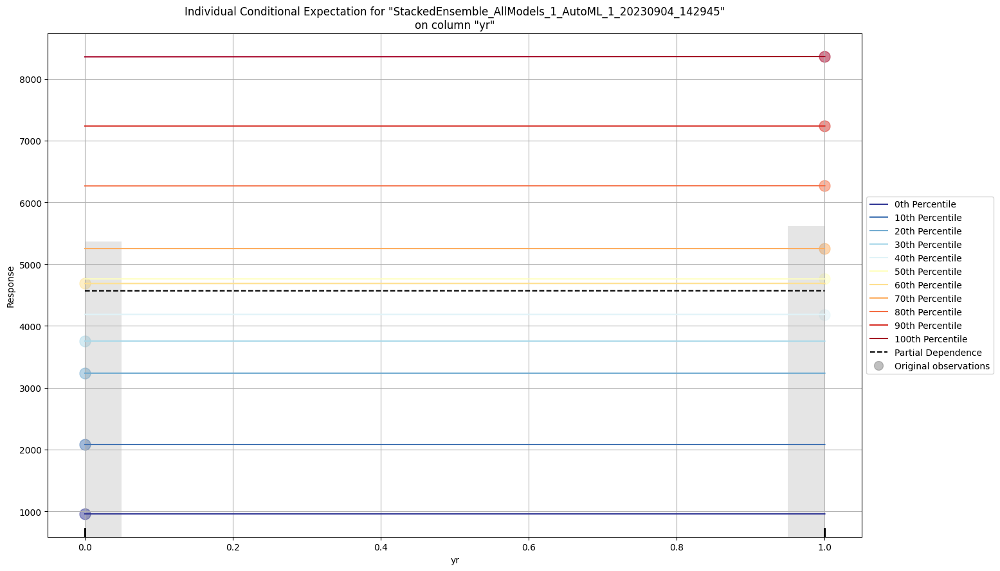

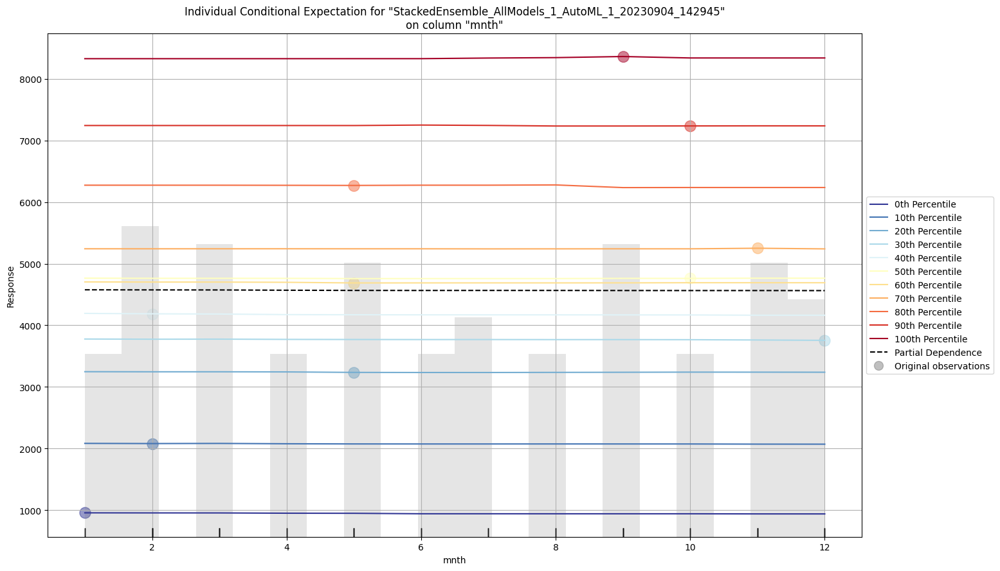

...

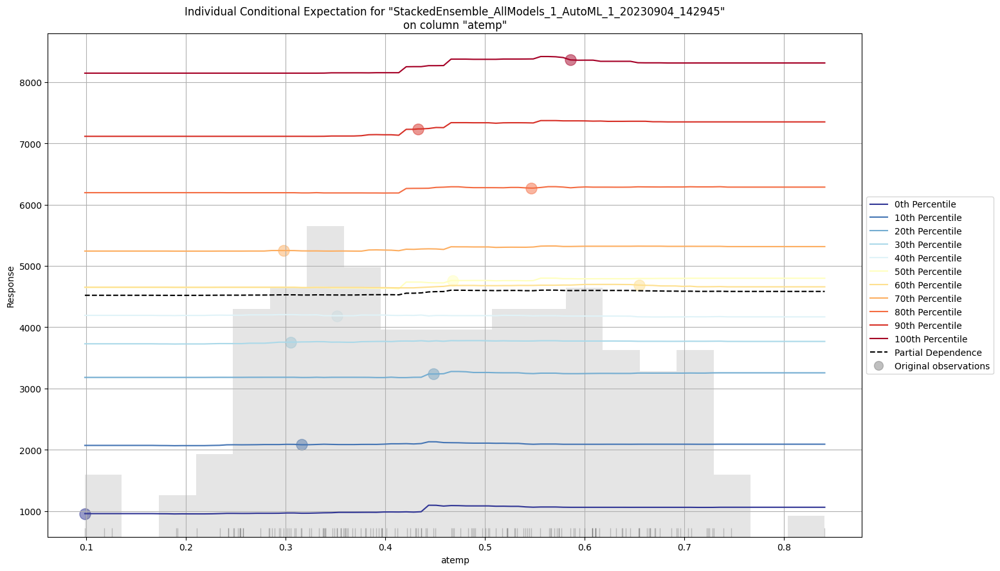

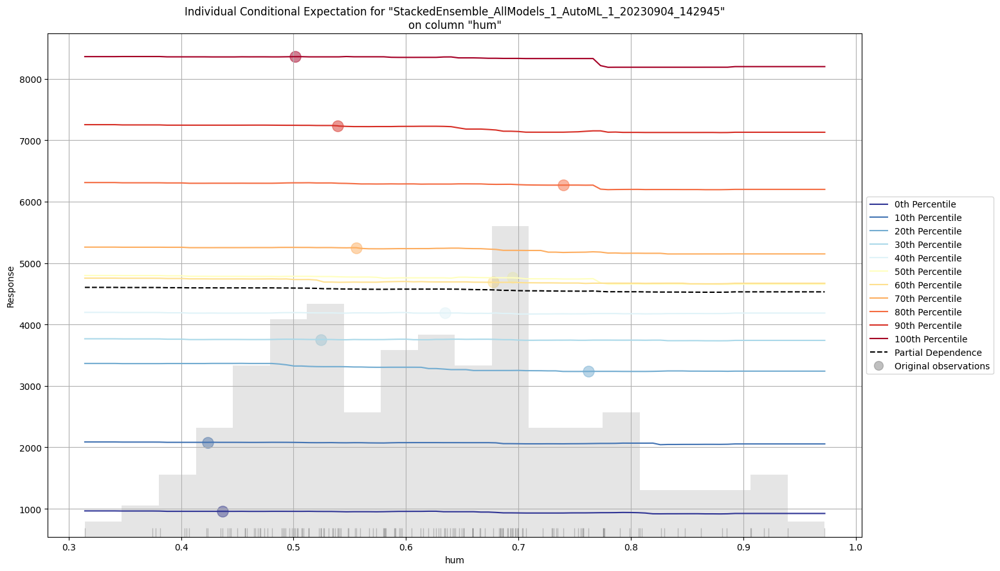

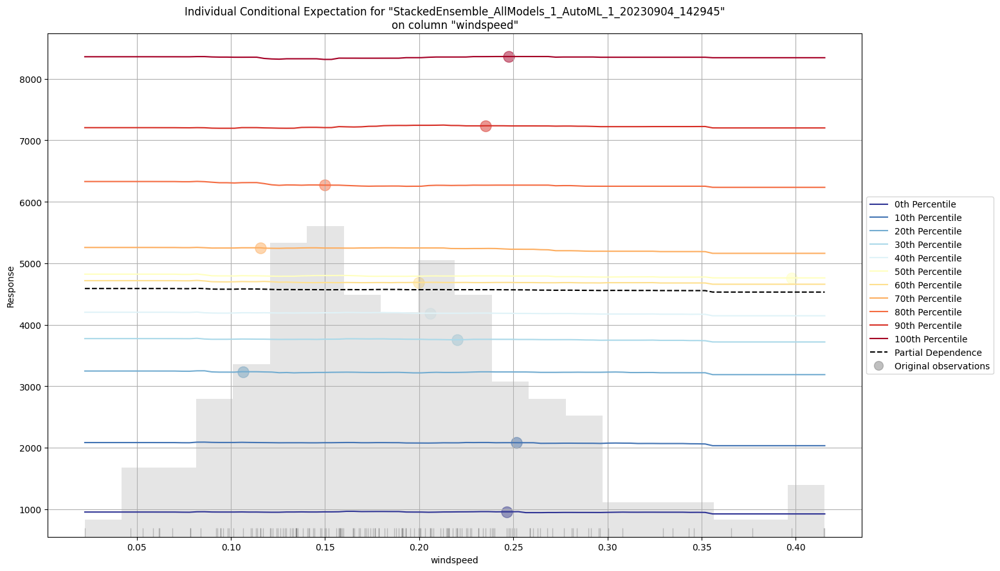

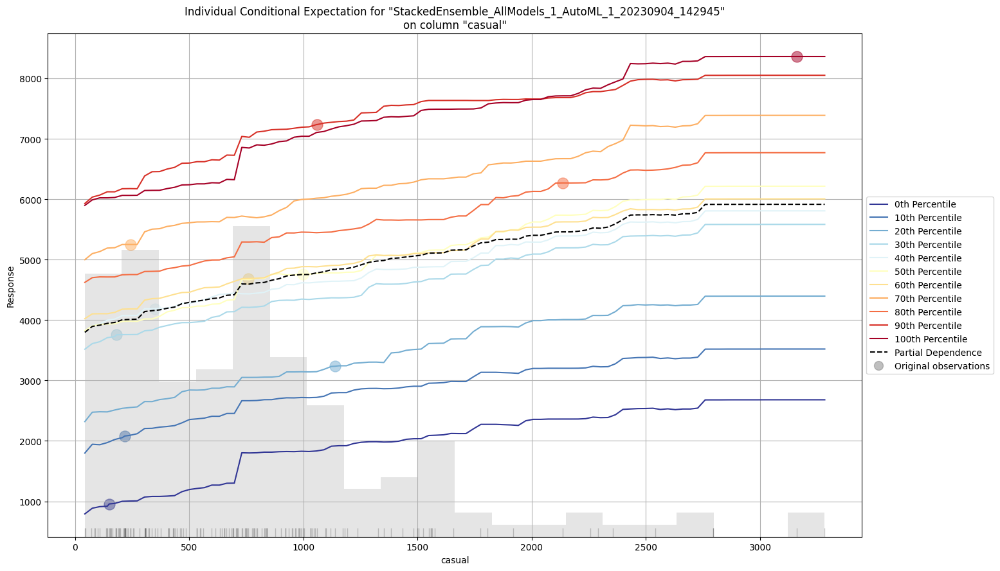

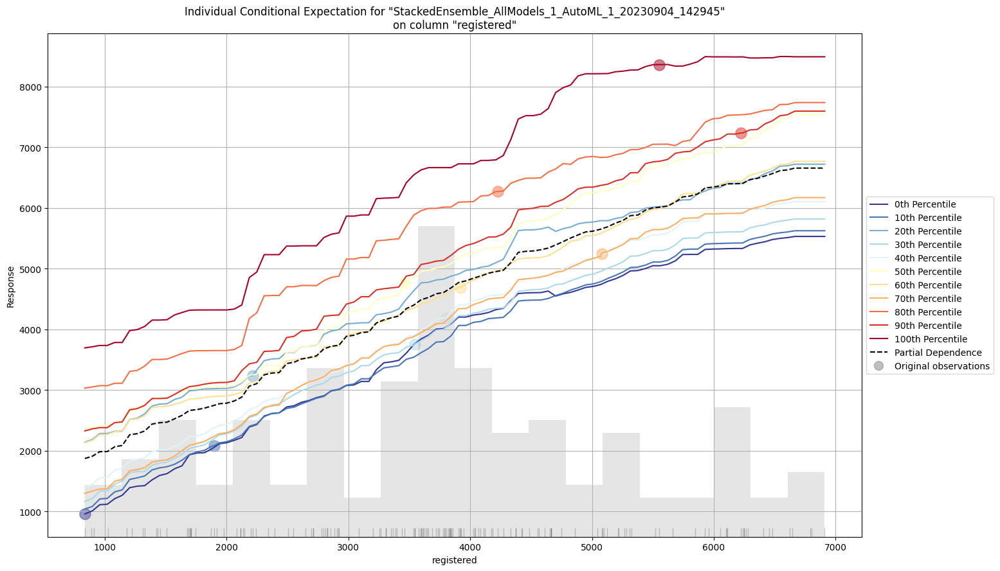

In [61]:
# Explain a single H2O model (e.g. leader model from AutoML)
exm_day = day_automl.leader.explain(day_test)

In [62]:
# Train AutoML models for Hour data

hour_automl = H2OAutoML(max_runtime_secs=60, seed=1)
hour_automl.train(y='cnt',training_frame=hourly_train)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),2/4
# GBM base models (used / total),0/1
# XGBoost base models (used / total),1/1
# GLM base models (used / total),1/1
# DRF base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5
Metalearner fold_column,None


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_BestOfFamily_1_AutoML_2_20230904_143800,2.0576,4.2337,1.6406,nan,4.2337,422,0.011264,StackedEnsemble
StackedEnsemble_AllModels_1_AutoML_2_20230904_143800,2.0576,4.2337,1.6406,nan,4.2337,419,0.011507,StackedEnsemble
StackedEnsemble_BestOfFamily_2_AutoML_2_20230904_143800,2.0576,4.2337,1.6406,nan,4.2337,324,0.009743,StackedEnsemble
GLM_1_AutoML_2_20230904_143800,3.27737,10.7412,2.34989,0.123063,10.7412,182,0.001185,GLM
XGBoost_1_AutoML_2_20230904_143800,7.82572,61.2418,4.79444,0.0754333,61.2418,1550,0.007634,XGBoost
GBM_1_AutoML_2_20230904_143800,9.31187,86.711,5.51821,nan,86.711,3396,0.047944,GBM
DRF_1_AutoML_2_20230904_143800,17.0896,292.053,9.49231,0.159151,292.053,509,0.003074,DRF
XRT_1_AutoML_2_20230904_143800,25.7667,663.922,13.3653,0.227209,663.922,294,0.002137,DRF
XGBoost_2_AutoML_2_20230904_143800,69.2113,4790.2,46.9173,0.267034,4790.2,458,0.001524,XGBoost
GBM_4_AutoML_2_20230904_143800,89.9007,8082.14,70.146,1.18172,8082.14,271,0.007029,GBM


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

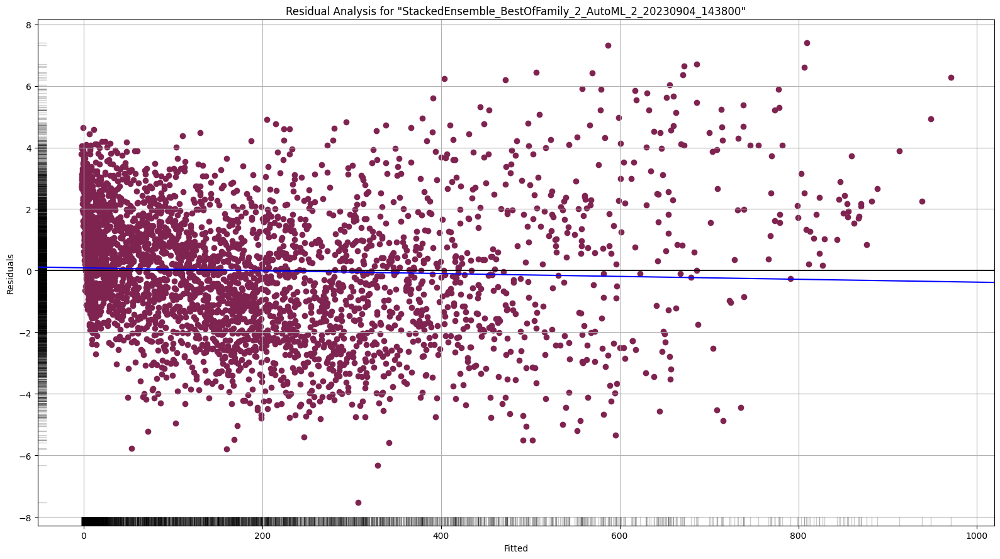

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

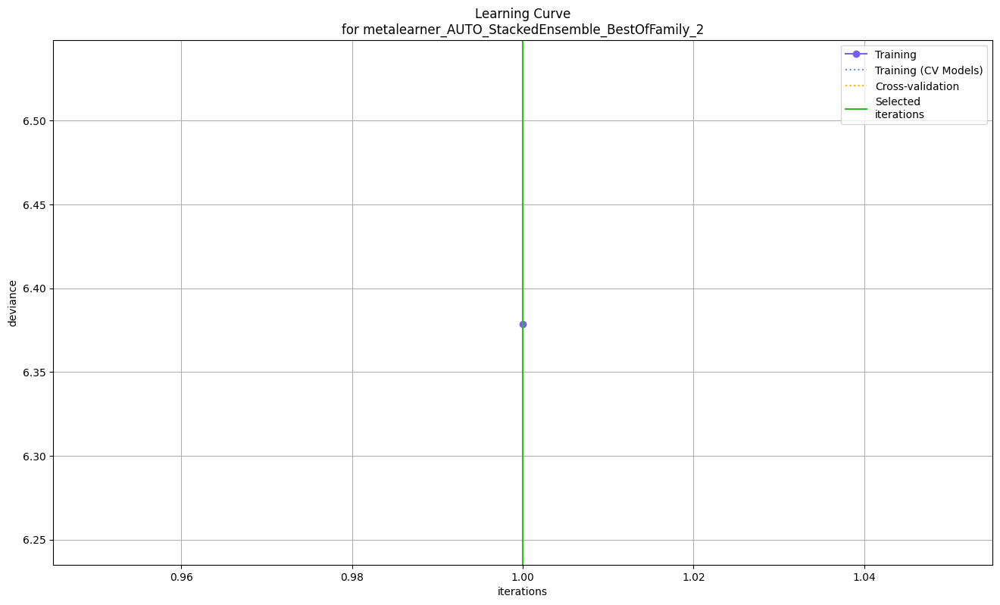

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

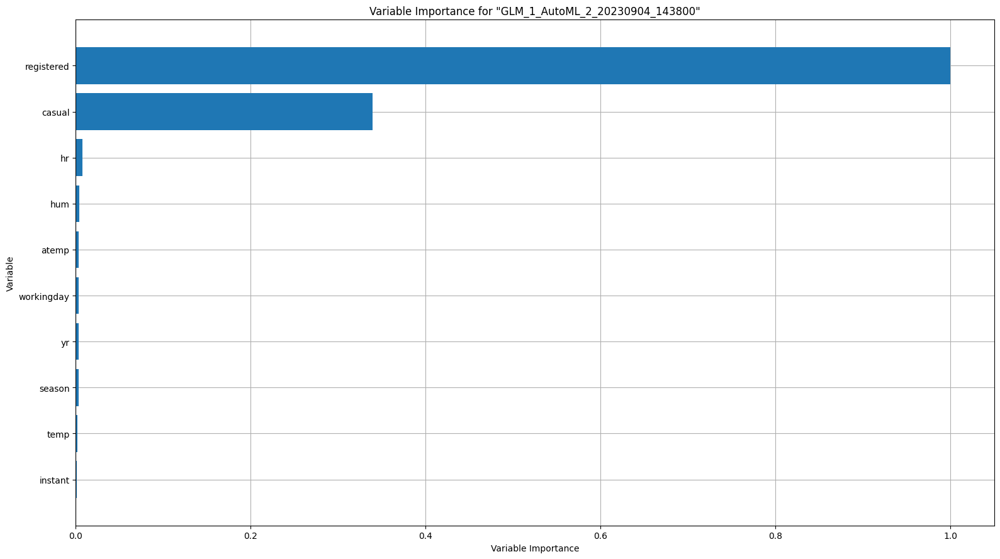

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

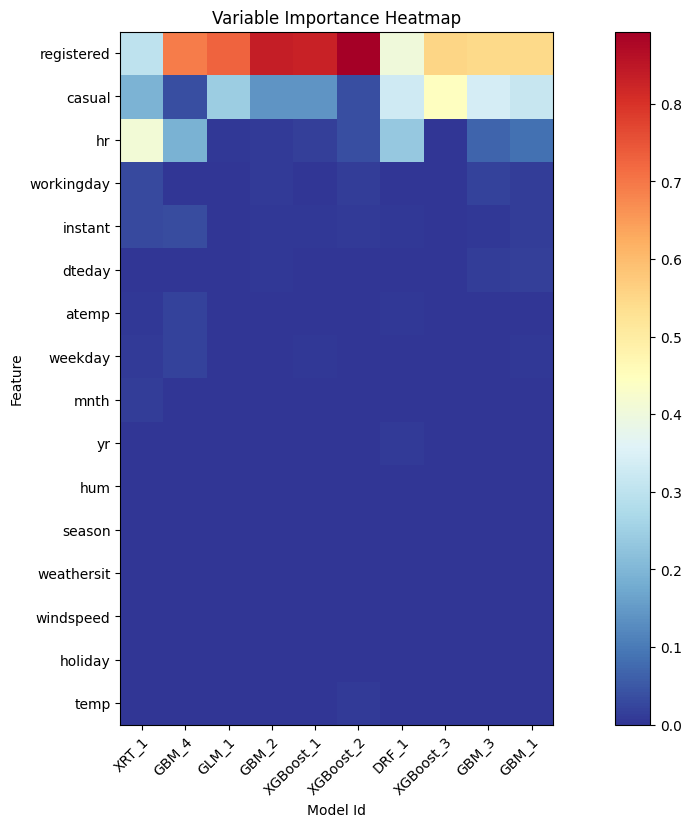

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

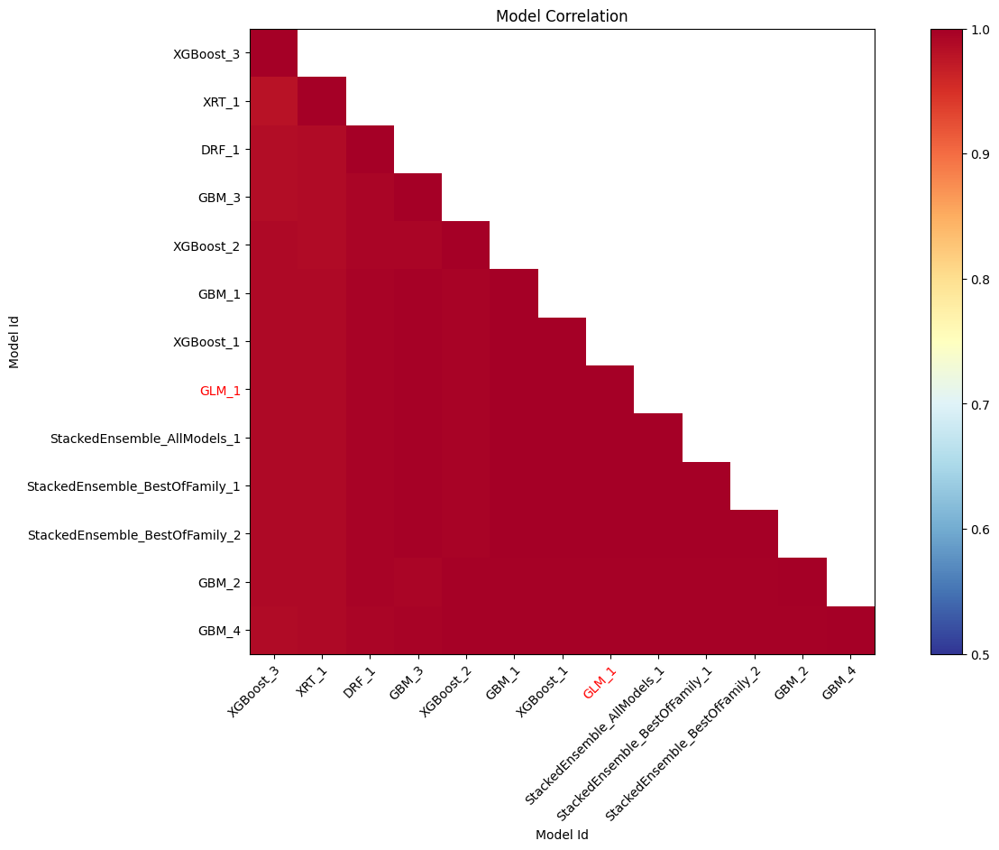

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

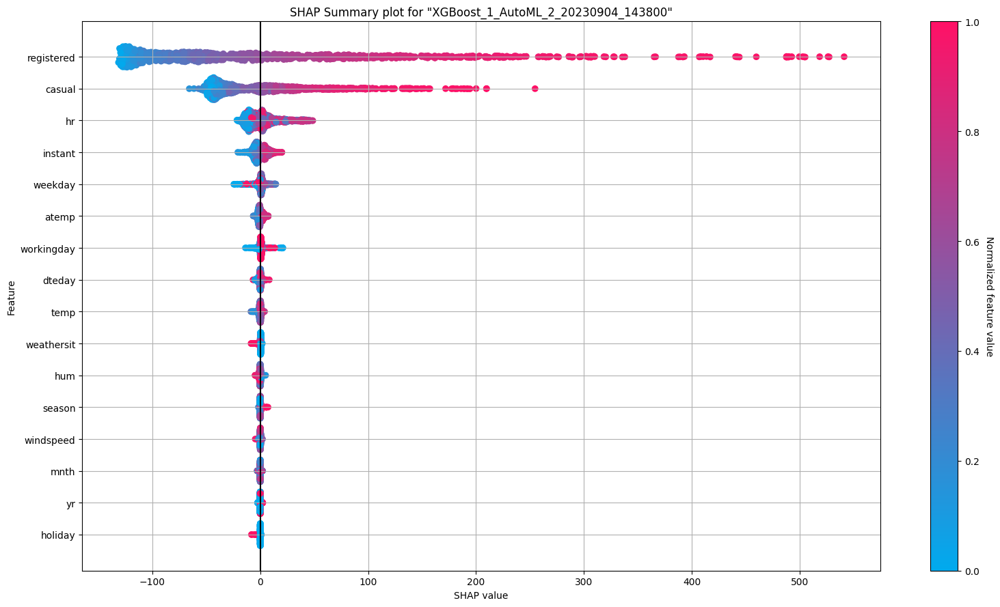

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

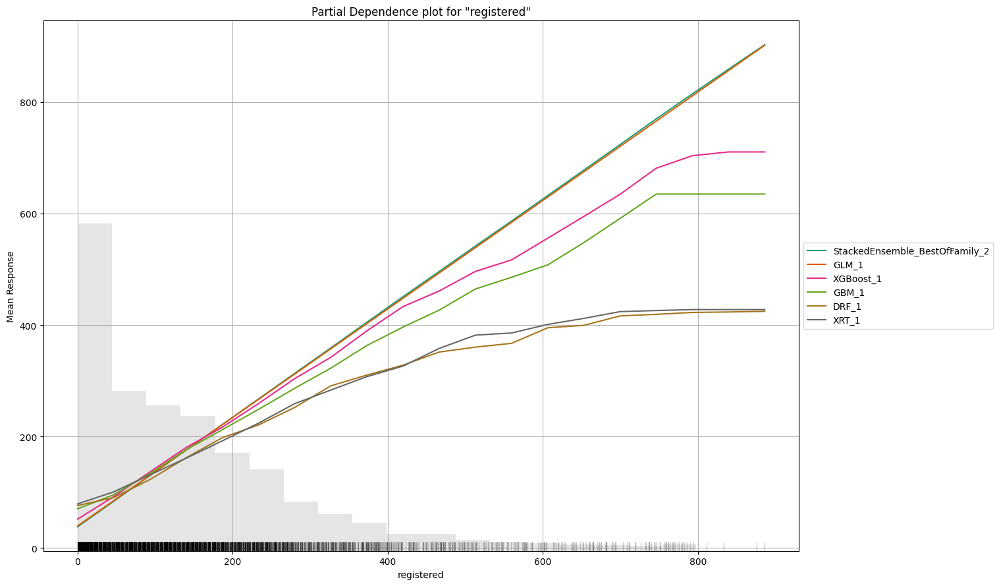

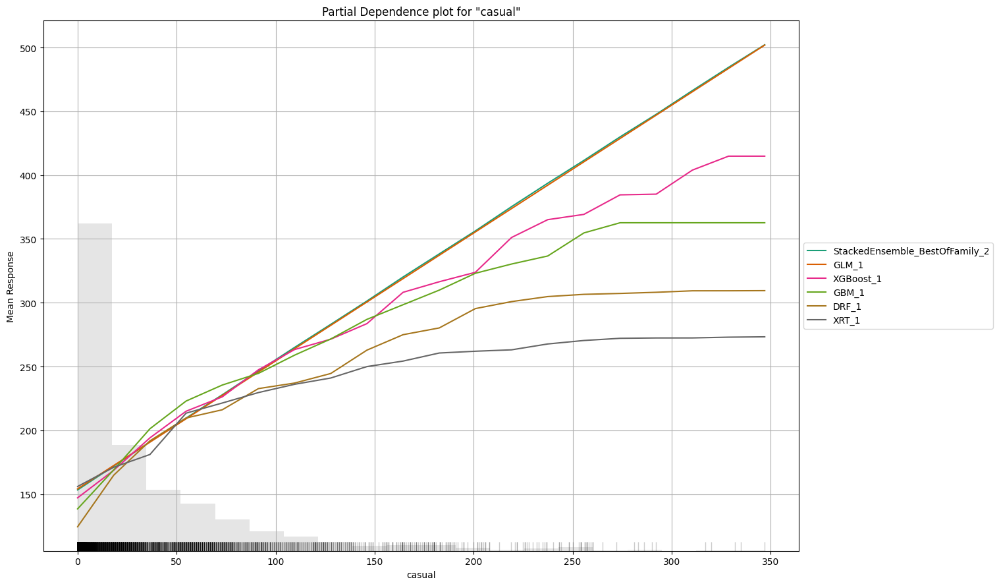

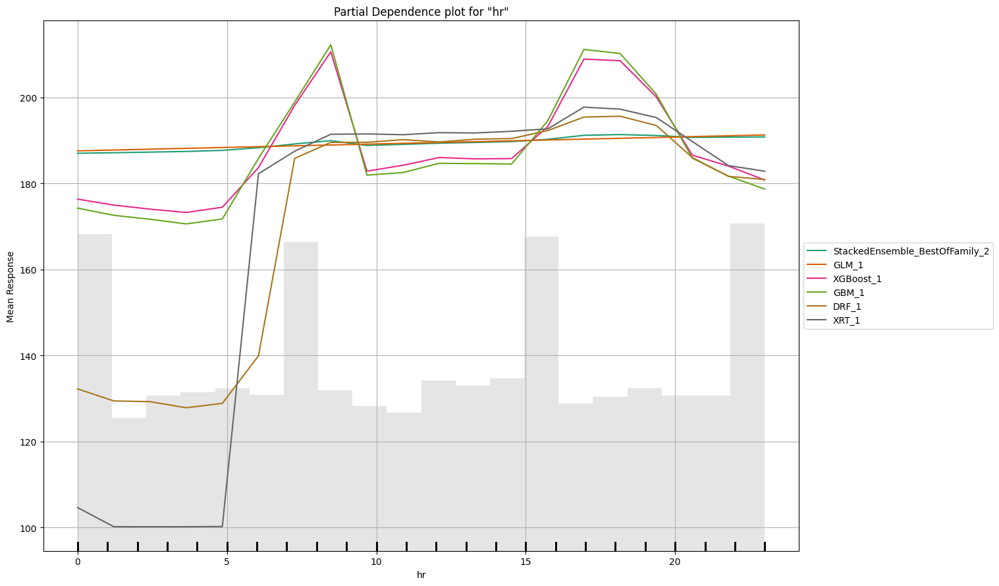

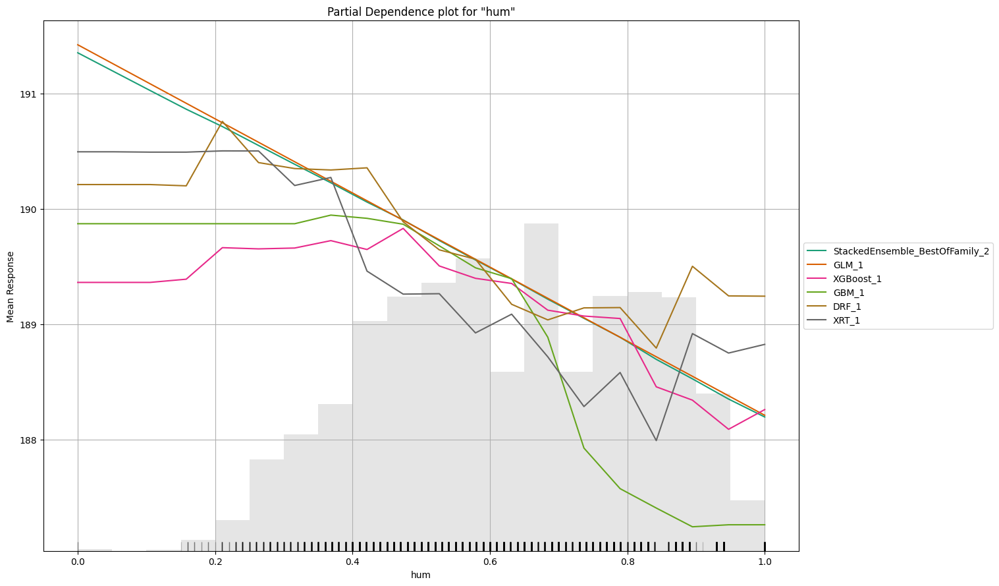

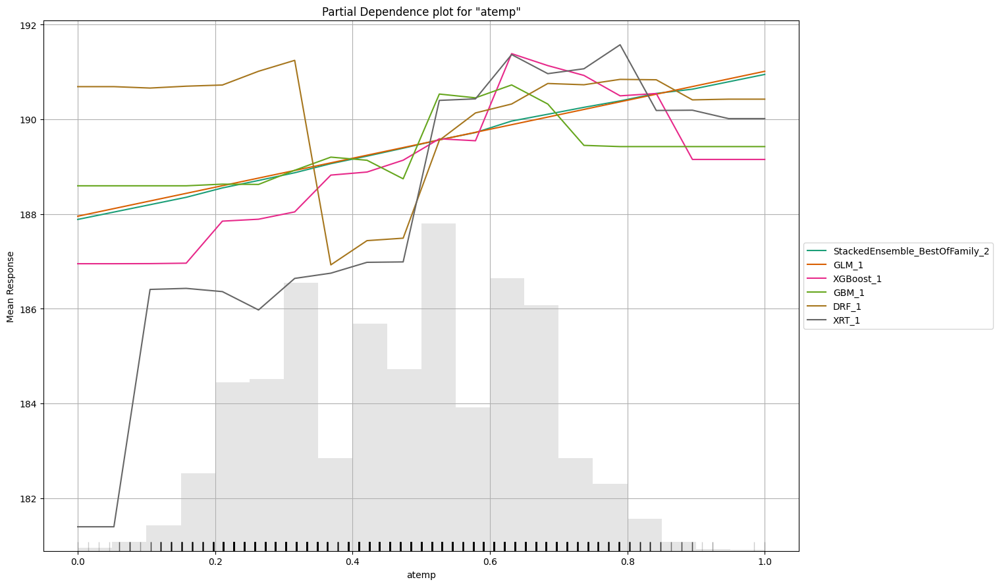

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

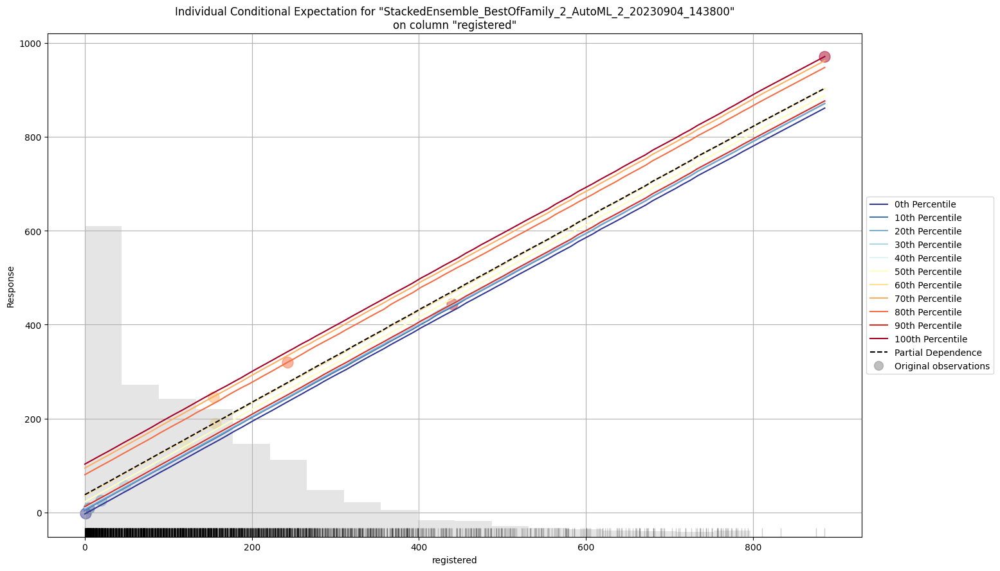

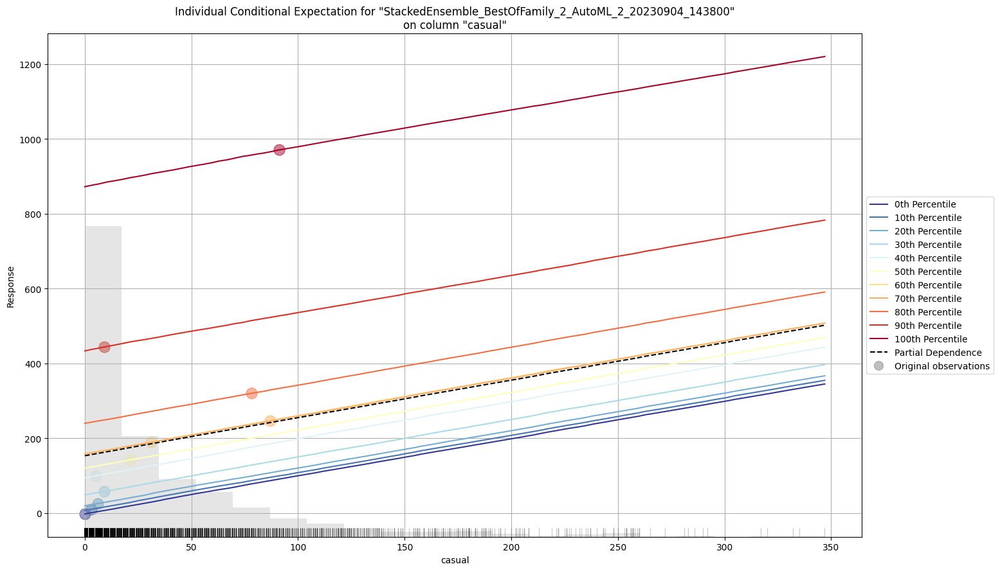

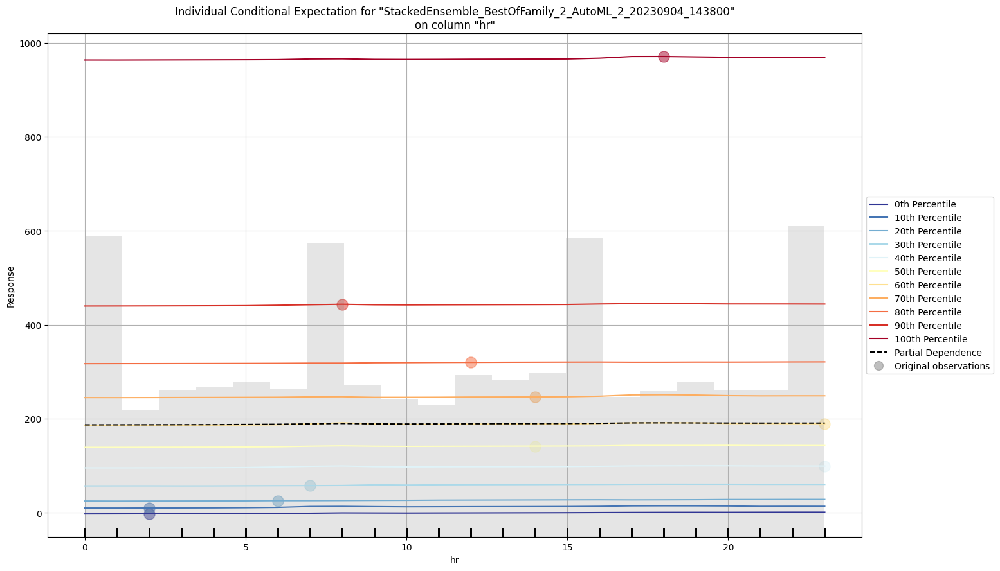

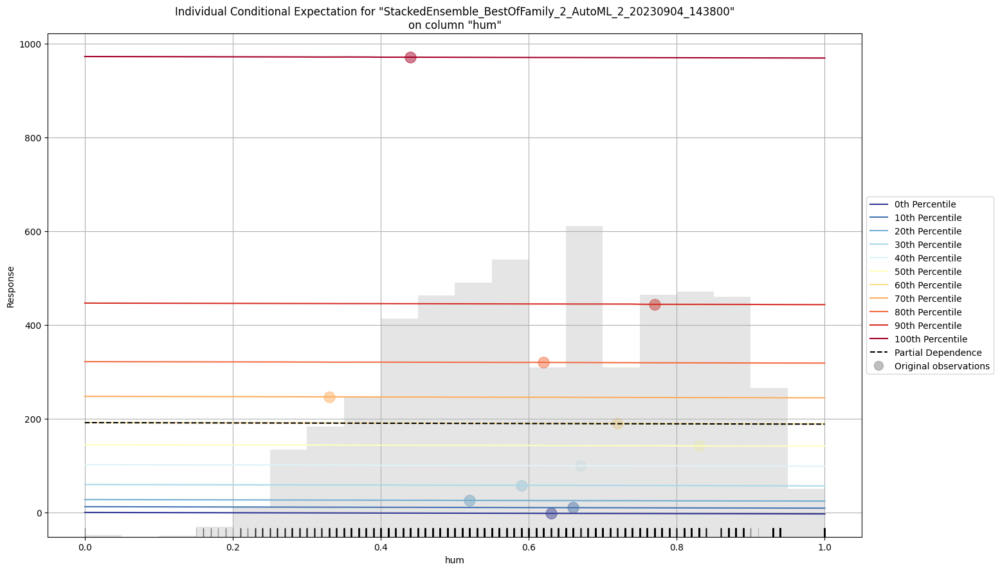

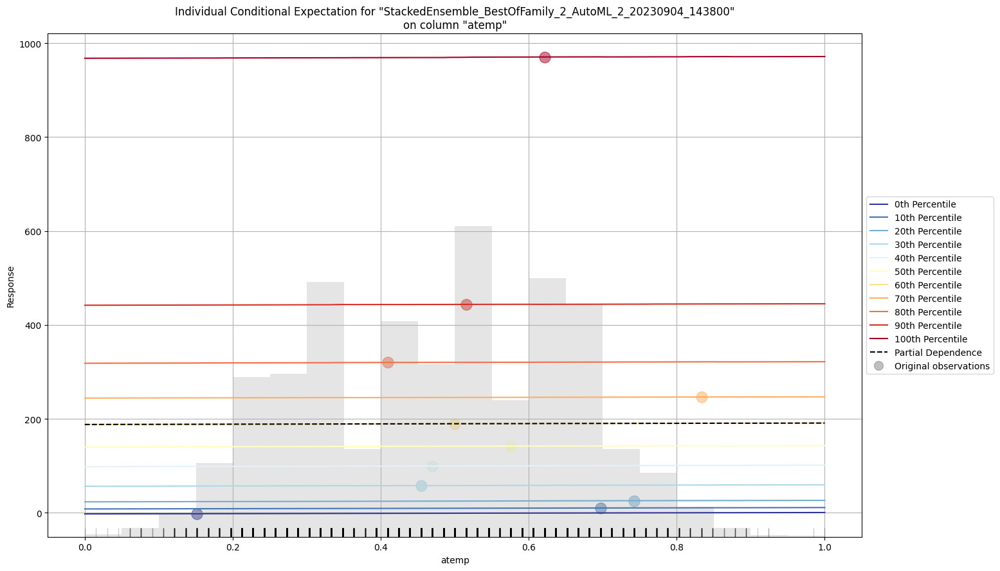

In [72]:
# Explain leader model & compare with all AutoML models
exa_hour = hour_automl.explain(hourly_test)

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

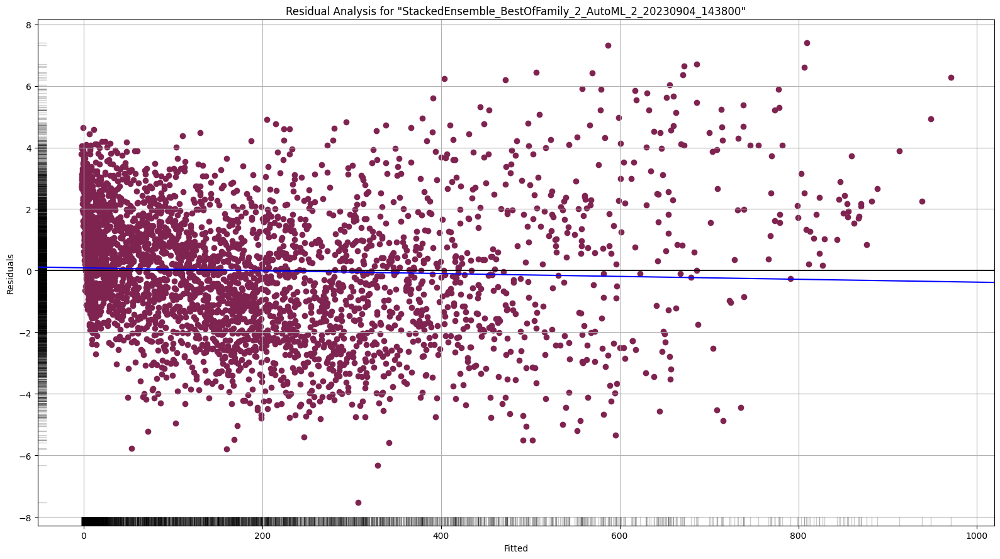

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

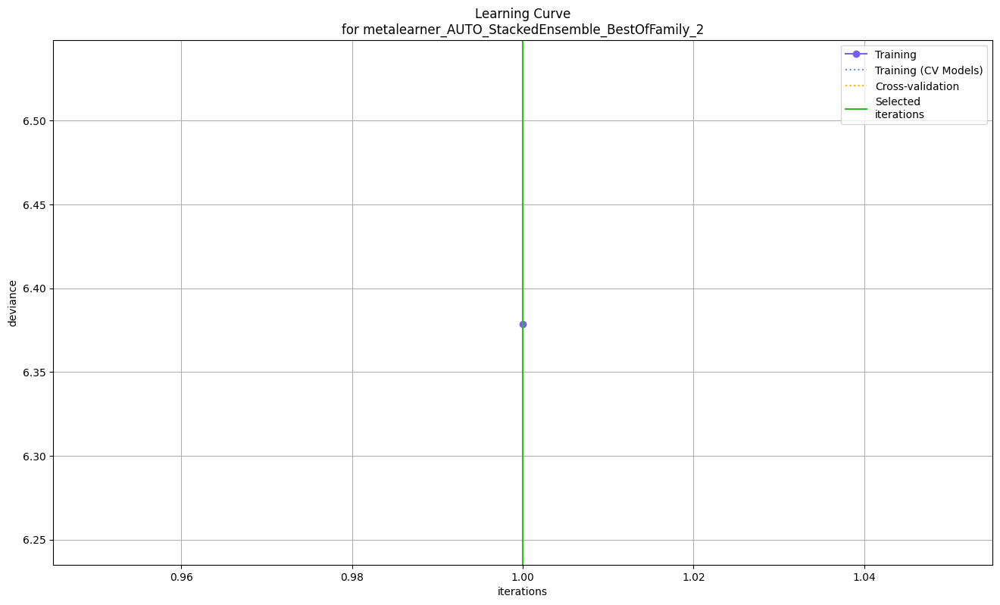

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

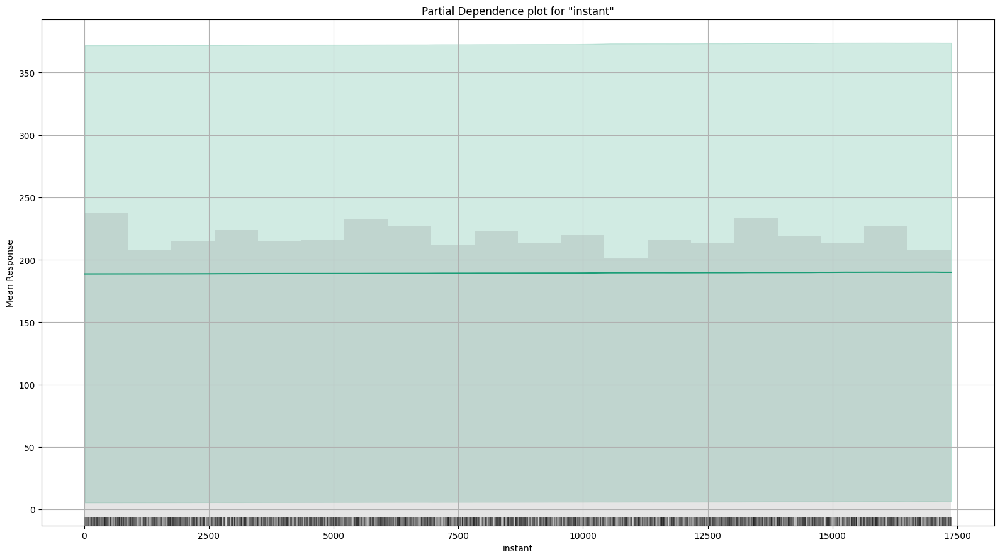

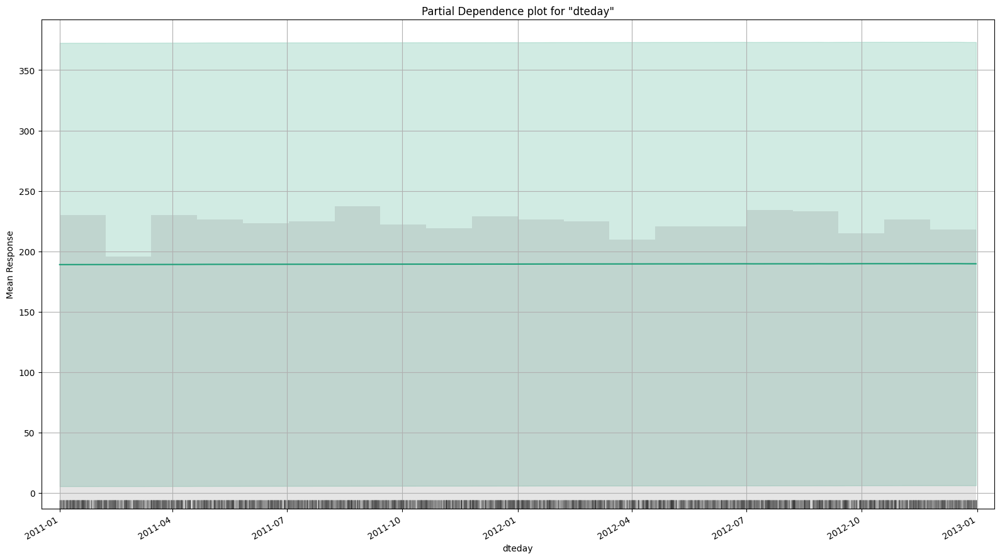

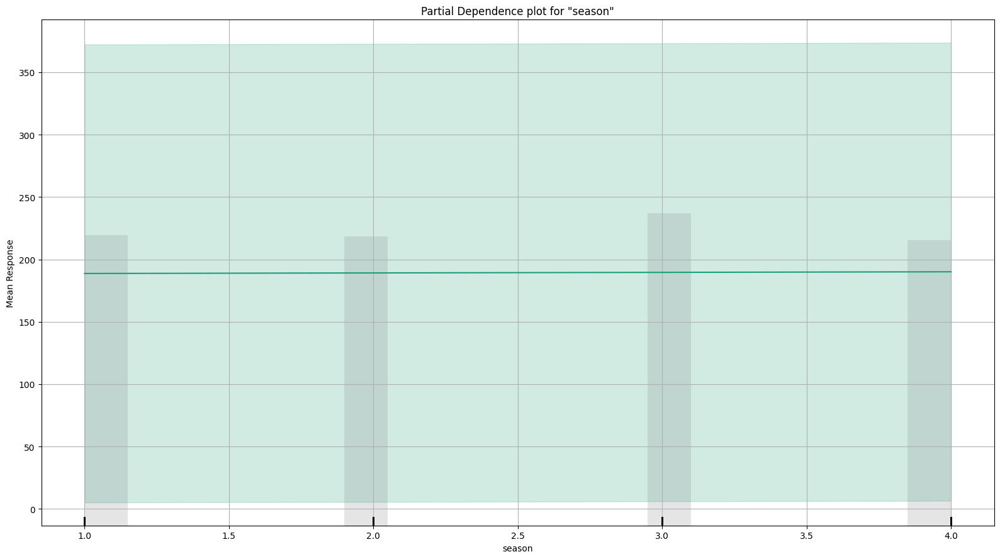

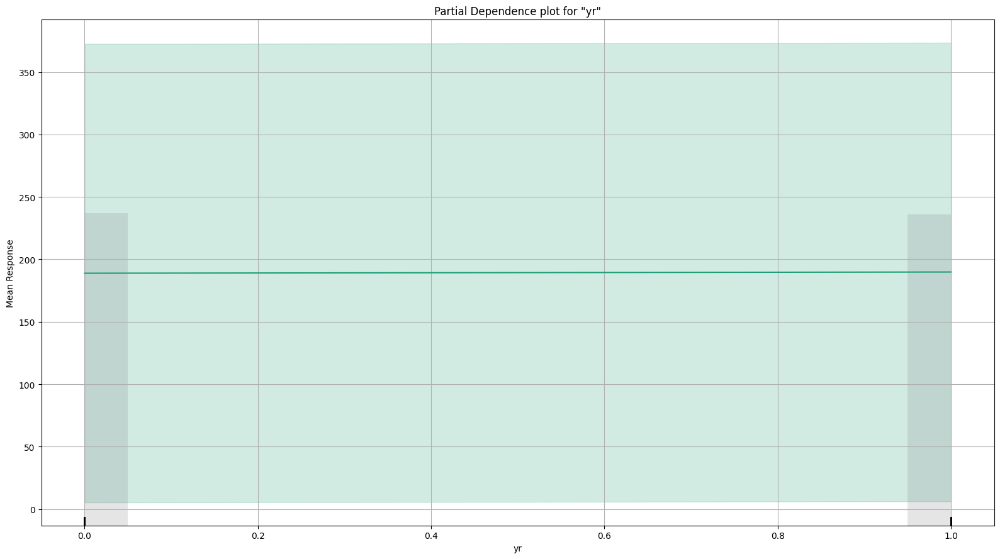

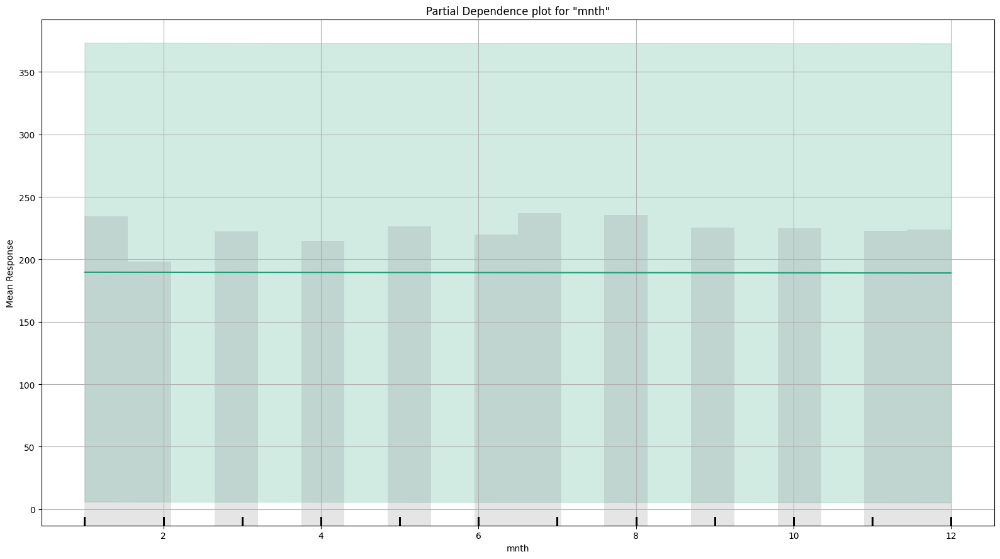

...

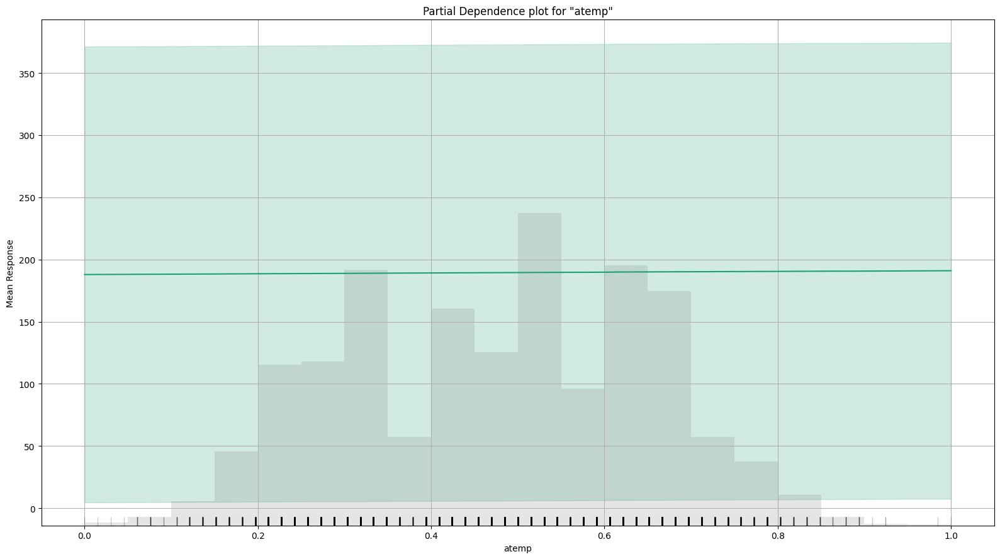

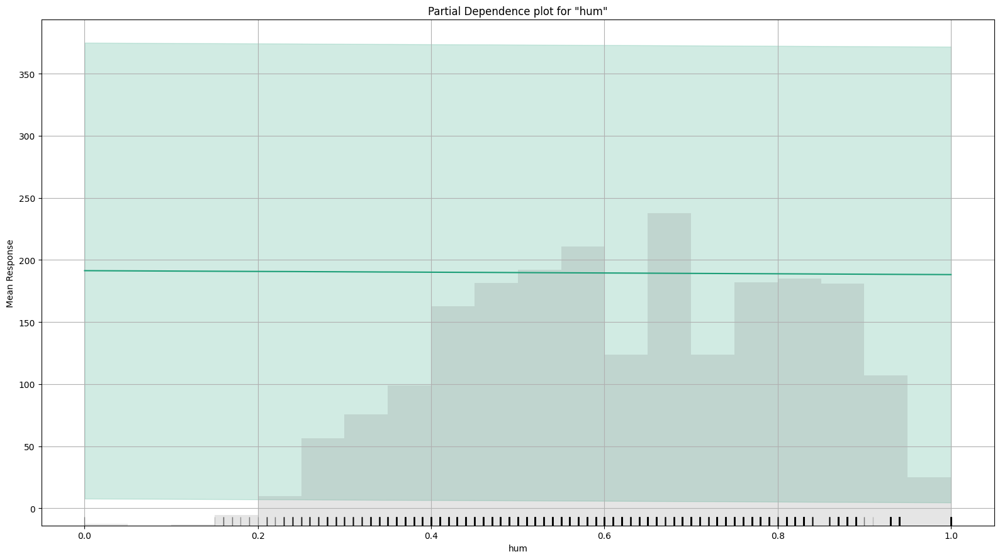

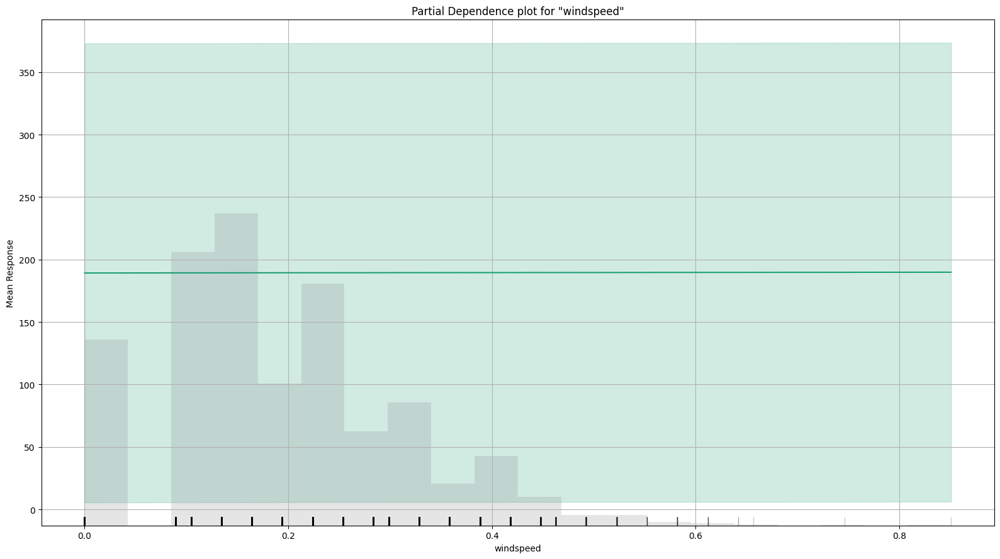

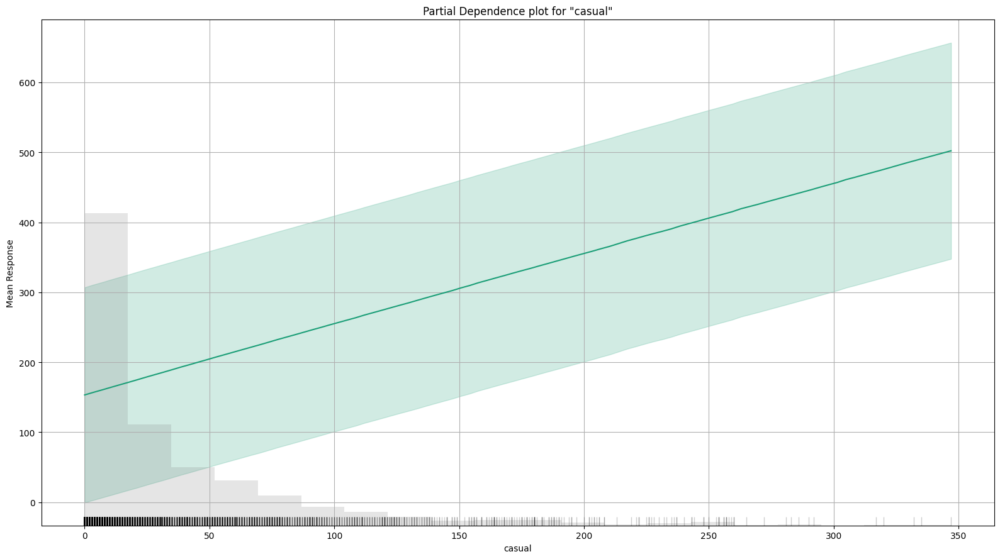

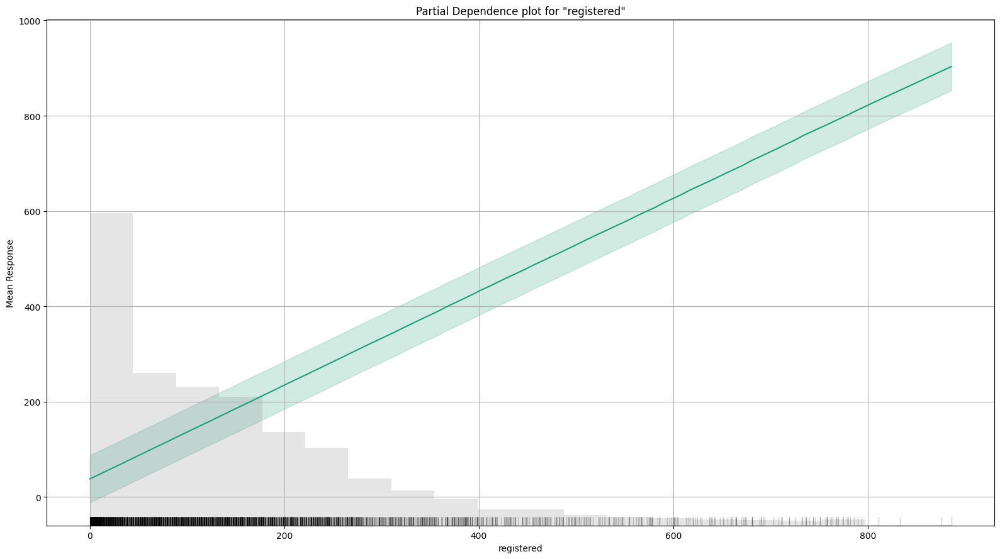

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

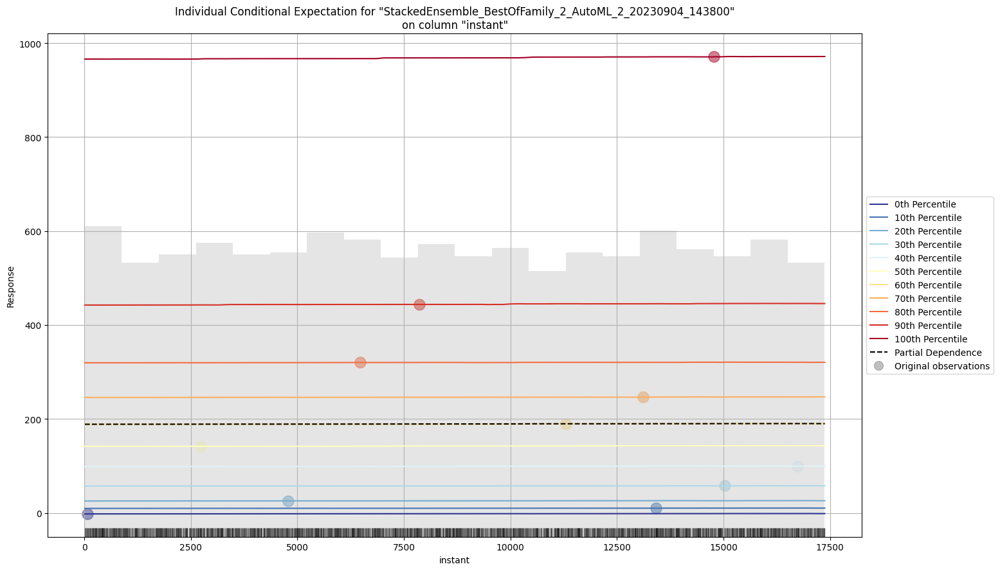

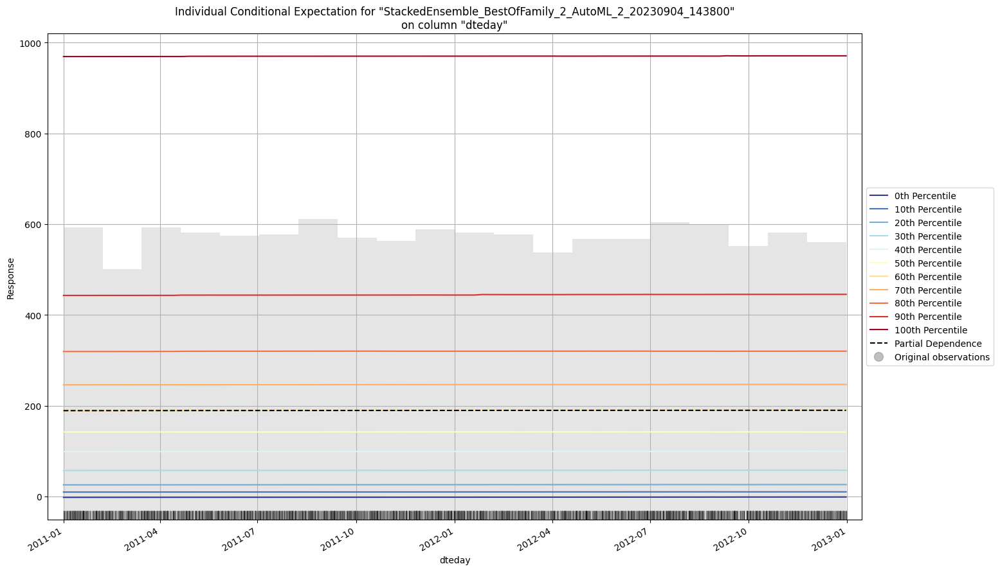

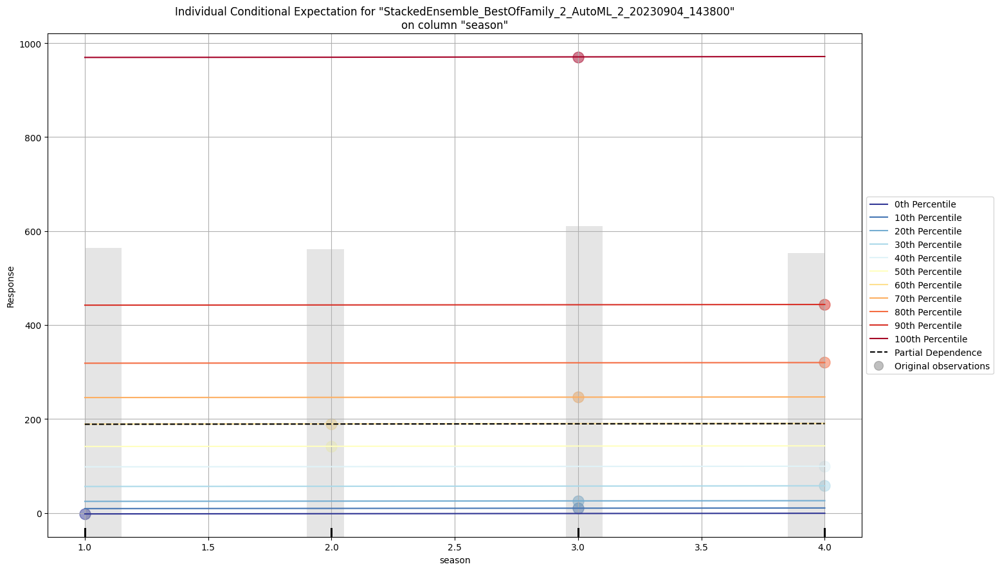

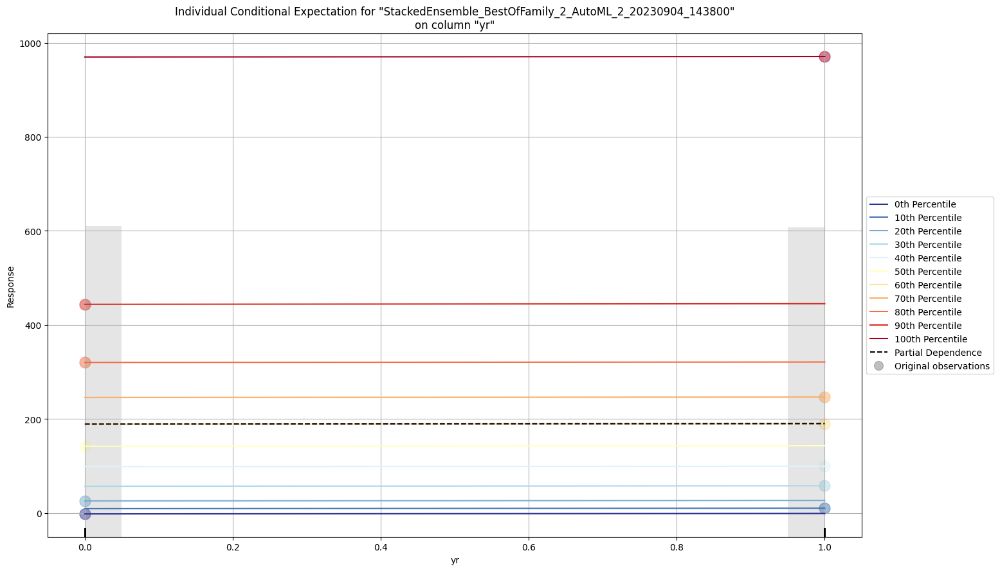

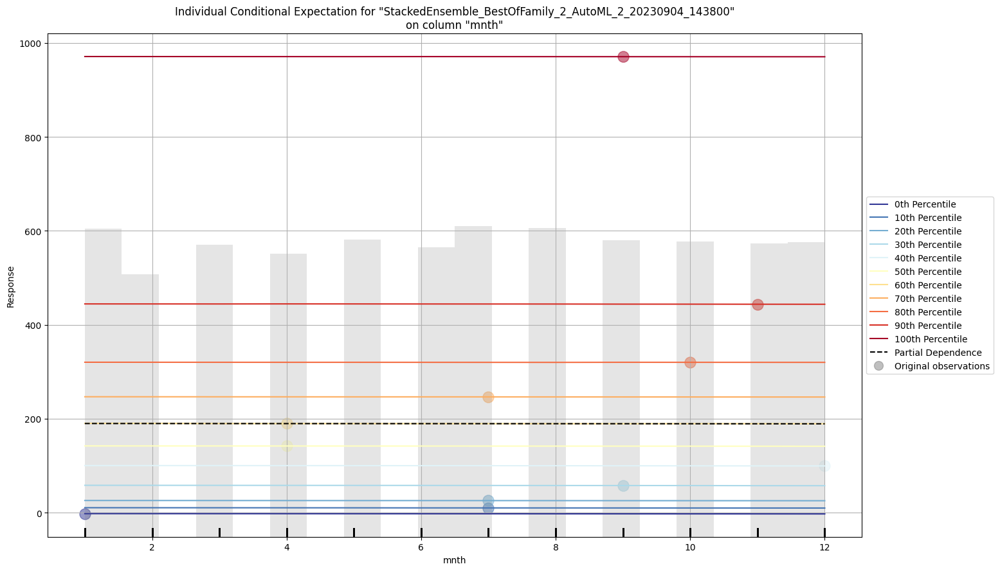

...

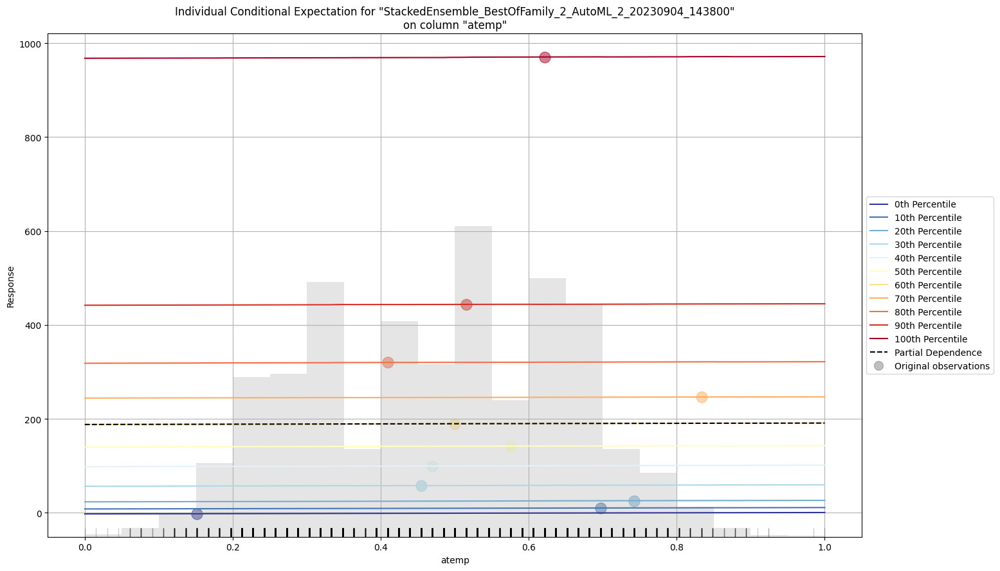

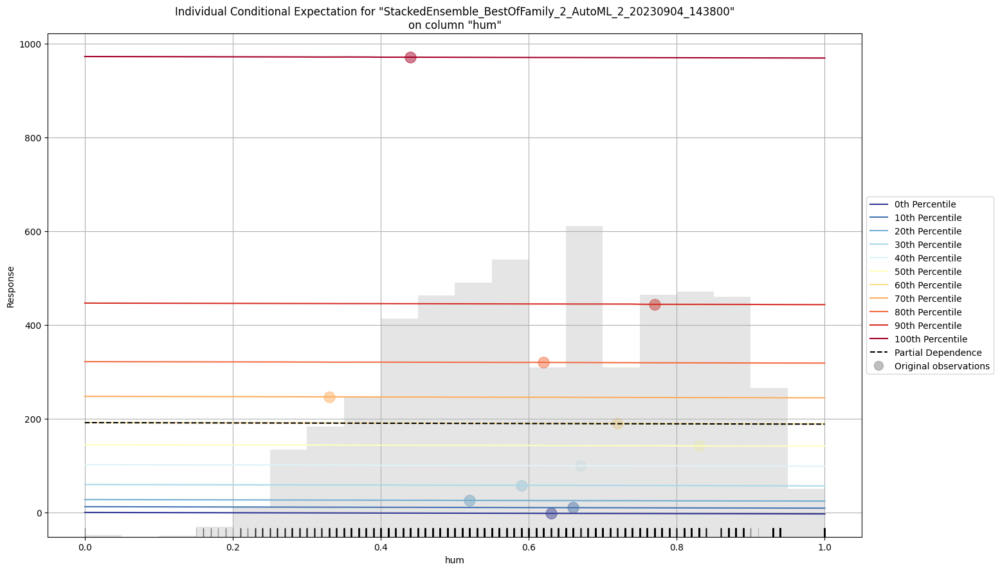

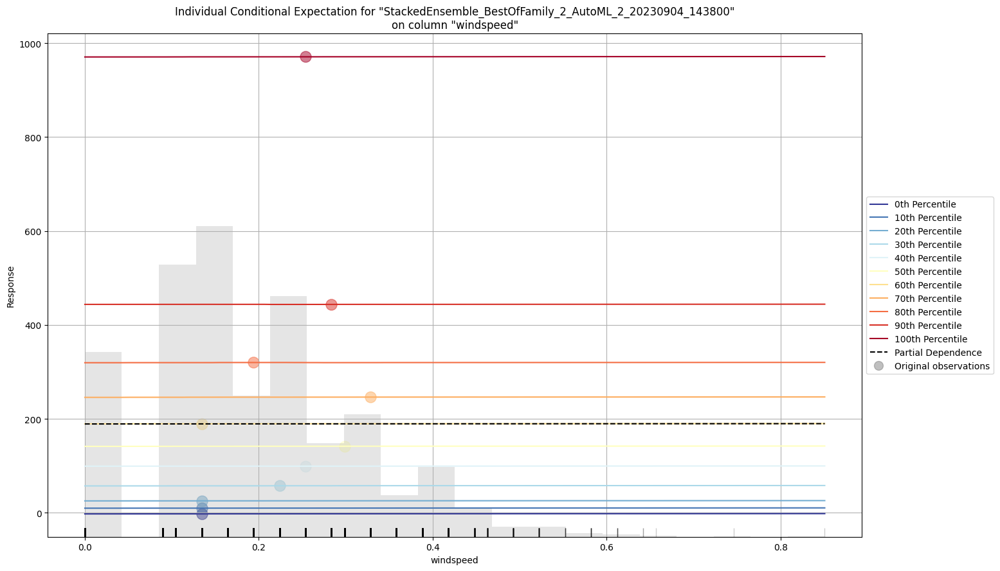

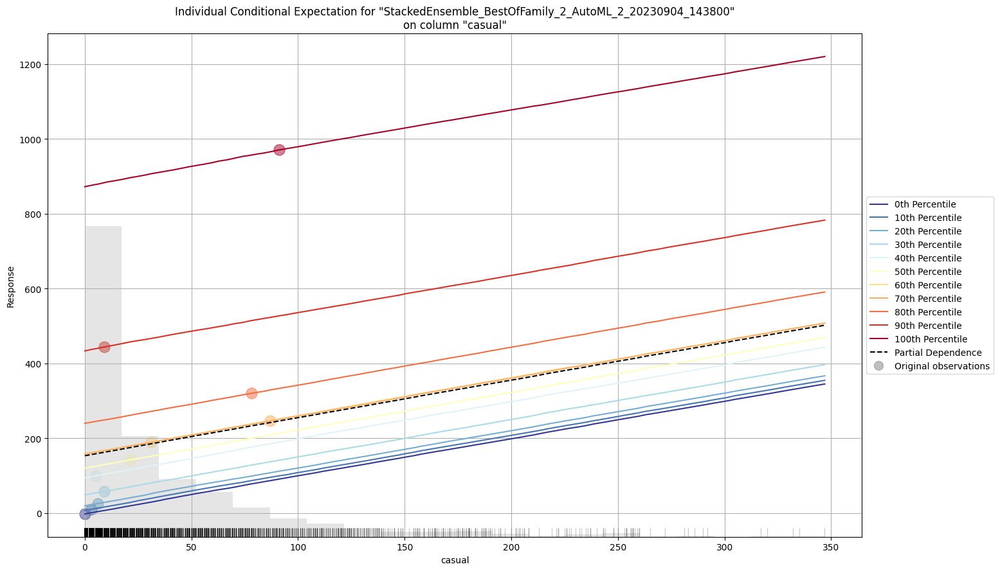

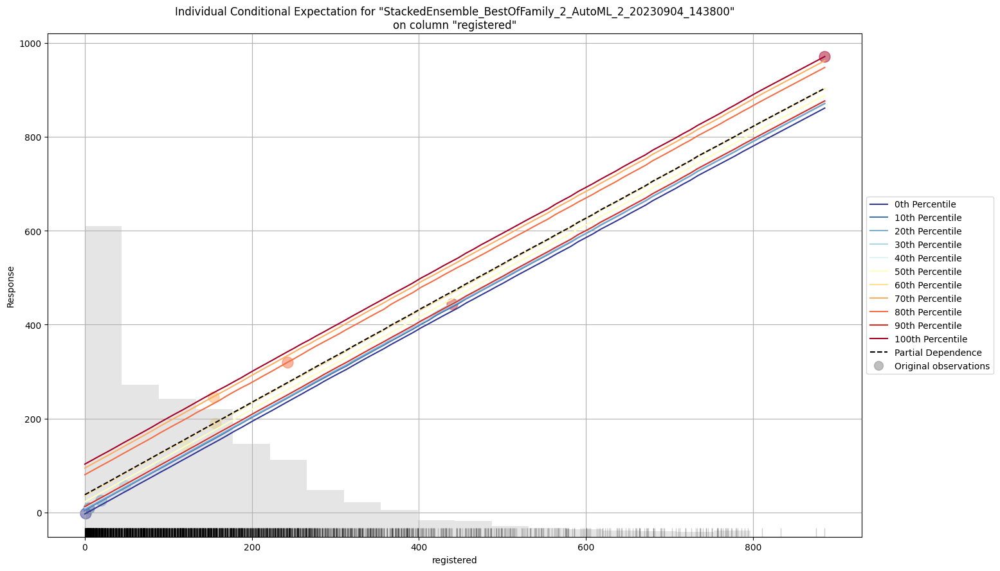

In [64]:
# Explain a single H2O model (e.g. leader model from AutoML)
exm_hour = hour_automl.leader.explain(hourly_test)

In [65]:
# Access AutoML leader model for Day data
day_leader_model = day_automl.leader

day_leader_model

key,value
Stacking strategy,cross_validation
Number of base models (used / total),4/8
# GBM base models (used / total),2/4
# XGBoost base models (used / total),2/2
# DRF base models (used / total),0/1
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5
Metalearner fold_column,None


In [66]:
day_df.columns

['instant',
 'dteday',
 'season',
 'yr',
 'mnth',
 'holiday',
 'weekday',
 'workingday',
 'weathersit',
 'temp',
 'atemp',
 'hum',
 'windspeed',
 'casual',
 'registered',
 'cnt']

In [67]:
# Access AutoML leader model for Hourly data
hourly_leader_model = hour_automl.leader

hourly_leader_model

key,value
Stacking strategy,cross_validation
Number of base models (used / total),2/4
# GBM base models (used / total),0/1
# XGBoost base models (used / total),1/1
# GLM base models (used / total),1/1
# DRF base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5
Metalearner fold_column,None


In [68]:
# Train a model (e.g., a gradient boosting model)

from h2o.estimators import H2OGradientBoostingEstimator
model = H2OGradientBoostingEstimator()
model.train(x=['temp','hum'], y='cnt', training_frame=day_train)

gbm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: GBM_model_python_1693837768618_34


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    50                 50                          13034                  5            5            5             6             25            16.1

ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 1104602.323592593
RMSE: 1051.000629682301
MAE: 862.606452293991
RMSLE: 0.36348374984007686
Mean Residual Deviance: 1104602.323592593

Scoring History: 
     timestamp            duration    number_of_trees    training_rmse       training_mae        training_deviance
---  -------------------  ----------  -----------------  ------------------  ------------------  -------------------
     2023-09-04 14:47:21  0.034 sec   0.0                1969.2548518794397  1625.3134392017555  3877964.671650714
     2023-09-04 14:47:21  0.049 sec   1.0                1850.9524293340028  1523.8330365847053  3426024.8956574467
     2023-09-04 14:47:21  0.055 sec   2.0                1747.6561817139548  1438.902866304024   3054302.1294829994
     2023-09-04 14:47:21  0.058 sec   3.0                1660.1869447637685  1368.0845043903     2756220.691564056
     2023-09-04 14:47:21  0.061 sec   4.0                1583.434782811308   1308.5698618764893  2507265.711416694
     2023-09-04 14:47:21  0.063 sec   5.0                1519.4197528482534  1258.8728175435983  2308636.385345448
     2023-09-04 14:47:21  0.068 sec   6.0                1464.9785572270257  1218.333826550991   2146162.173134978
     2023-09-04 14:47:21  0.071 sec   7.0                1417.085252642995   1182.463261701825   2008130.6132582615
     2023-09-04 14:47:21  0.073 sec   8.0                1376.8527588507336  1152.4295990677806  1895723.5195548763
     2023-09-04 14:47:21  0.079 sec   9.0                1341.7286917018878  1125.0430715683221  1800235.8821360595
---  ---                  ---         ---                ---                 ---                 ---
     2023-09-04 14:47:21  0.224 sec   41.0               1064.7145290486205  876.84258324476     1133617.028367226
     2023-09-04 14:47:21  0.228 sec   42.0               1061.893911782832   873.2526129816806   1127618.6798814451
     2023-09-04 14:47:21  0.231 sec   43.0               1060.029675476965   871.3330397581104   1123662.9128917996
     2023-09-04 14:47:21  0.234 sec   44.0               1058.6838077648679  870.2633507264136   1120811.4048235198
     2023-09-04 14:47:21  0.238 sec   45.0               1056.4077417392402  868.4114804061281   1115997.3168066011
     2023-09-04 14:47:21  0.241 sec   46.0               1055.3472341184472  867.3981195248185   1113757.7845614564
     2023-09-04 14:47:21  0.244 sec   47.0               1053.8326108014303  865.5727168831916   1110563.171588559
     2023-09-04 14:47:21  0.246 sec   48.0               1052.8959013260487  864.5094825572736   1108589.7790291924
     2023-09-04 14:47:21  0.249 sec   49.0               1051.8122179809138  863.4876736487219   1106308.9418939291
     2023-09-04 14:47:21  0.252 sec   50.0               1051.000629682301   862.606452293991    1104602.323592593
[51 rows x 7 columns]


Variable Importances: 
variable    relative_importance    scaled_importance    percentage
----------  ---------------------  -------------------  ------------
temp        6.76854e+09            1                    0.803649
hum         1.65372e+09            0.244325             0.196351

[tips]
Use `model.explain()` to inspect the model.
--
Use `h2o.display.toggle_user_tips()` to switch on/off this section.

In [69]:
# Make predictions on the test set
predictions = model.predict(day_test)

# Convert the predictions to a pandas DataFrame
# predictions_df = predictions.as_data_frame()

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


In [70]:
# Create a DataFrame from 'predictions'
predictions_df = pd.DataFrame(predictions)

In [73]:
# Save the DataFrame to a CSV file
file_path = "/content/drive/MyDrive/Bike Rental predictions.csv"
predictions_df.to_csv(file_path, index=False)